<h3>株価の相関などを基にしたペア・トレード向け情報作成</h3>
<h5>課題</h5>
<ul>
    <li>数値が辞書型になっているものを引き出したい</li>
    <li>htmlの表にしたい</li>
    <li>日々更新、webサイトにアップしたい</li>
</ul>

In [1]:
import os
from datetime import datetime, timedelta
import pandas as pd
import numpy as np
import os
import joblib
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import json

import sys

# 共通のパス
COMMON_PATH = "C:/Users/jeguc/Analysis/myInvest/JE-Quants"

In [2]:
dir_path = f'{COMMON_PATH}/JQ_factor_analysis/'

filepath_stock_fin = os.path.join(dir_path, 'stock_fin_load.csv.gz')
filepath_stock_price = os.path.join(dir_path, 'stock_price_load.csv.gz')
filepath_list_json = os.path.join(dir_path, 'all_stock.json')
filepath_list_history = os.path.join(dir_path, 'list_history.csv')
#filepath_stock_list   = os.path.join(dir_path, 'stock_list_load.gz')

In [3]:
# J-Quants API から取得するデータの期間
HISTORICAL_DATA_YEARS = 5
HISTORICAL_DATA_UNTIL_DAYS = 0
start_dt: datetime = datetime.now().replace(hour=0, minute=0, second=0, microsecond=0) \
                          - timedelta(days=(HISTORICAL_DATA_YEARS*365 + HISTORICAL_DATA_UNTIL_DAYS))
end_dt: datetime = datetime.now().replace(hour=0, minute=0, second=0, microsecond=0) \
                           - timedelta(days=(HISTORICAL_DATA_UNTIL_DAYS))

In [4]:
filepath_topix = os.path.join(dir_path, 'topix_history.csv')

df_topix = pd.read_csv(filepath_topix, encoding = "utf-8-sig")
df_topix['Date'] = pd.to_datetime(df_topix['Date'])

df_topix = df_topix.sort_values(["Date"], ascending = [False]).reset_index(drop = True)
display("df_topix : ", df_topix)

latest_date = df_topix.iloc[0,:]["Date"].strftime('%Y%m%d')
latest_date2 = df_topix.iloc[0,:]["Date"].strftime('%Y-%m-%d')

'df_topix : '

,Date,Open,High,Low,Close
0,2025-04-10,2395.14,2545.31,2394.66,2539.40
1,2025-04-09,2395.24,2397.81,2318.53,2349.33
2,2025-04-08,2330.47,2452.78,2329.93,2432.02
3,2025-04-07,2432.24,2432.78,2243.21,2288.66
4,2025-04-04,2534.73,2536.51,2436.88,2482.06
...,...,...,...,...,...
1407,2019-07-05,1590.39,1593.50,1587.68,1592.58
1408,2019-07-04,1586.37,1589.93,1585.11,1589.78
1409,2019-07-03,1582.81,1583.02,1573.27,1579.54
1410,2019-07-02,1584.72,1590.79,1583.96,1589.84


In [5]:
#Dateはparse_datesで指定している。
stock_price_dtype = {
"Code" : "object", 
"Open" : "object", 
"High" : "object", 
"Low" : "object", 
"Close" : "object", 
"UpperLimit" : "object", 
"LowerLimit" : "object", 
"Volume" : "object", 
"TurnoverValue" : "object", 
"AdjustmentFactor" : "float64", 
"AdjustmentOpen" : "object", 
"AdjustmentHigh" : "object", 
"AdjustmentLow" : "object", 
"AdjustmentClose" : "float64", 
"AdjustmentVolume" : "object"
}

if os.path.exists(filepath_stock_price):
    print("The file exist. Reading it.")
    # ファイルが存在する場合、読み込む
    stock_price_load = pd.read_csv(filepath_stock_price, compression='gzip', dtype = stock_price_dtype,
                                   parse_dates=["Date"])
    
    #stock_price_load["AdjustmentClose"] = stock_price_load["AdjustmentClose"].astype(float)
    
else:
    print("The file doesn't exist. Getting it from DB.")
    
# 普通株 (5桁で末尾が0) の銘柄コードを4桁に変換
stock_price_load["Code"] = stock_price_load["Code"].astype(str)
stock_price_load.loc[(stock_price_load["Code"].str.len() == 5) \
                       & (stock_price_load["Code"].str[-1] == "0"), "Code"] \
                    = stock_price_load.loc[(stock_price_load["Code"].str.len() == 5) \
                       & (stock_price_load["Code"].str[-1] == "0"), "Code"].str[:-1]

The file exist. Reading it.


In [6]:
#ユニバースの選定
def select_universe(Sector33Code = "7100"):

    df_list_hist = pd.read_csv(filepath_list_history, dtype = str)#, index=False, encoding = "utf-8-sig")
    
    df_list_hist_latest = df_list_hist[(df_list_hist["From_Date"] <= latest_date2) \
                                  & (df_list_hist["End_Date"] >= latest_date2)] \
                                  .drop(["From_Date", "End_Date"], axis = 1).copy()
    df_list_hist_latest["Date"] = pd.to_datetime(latest_date2)
    
    #debug display(df_list_hist_latest)

    print(df_list_hist_latest[["Sector33Code", "Sector33CodeName"]].value_counts())
    df_list_universe = df_list_hist_latest[(df_list_hist_latest["Sector33Code"] == Sector33Code) &
                                           (df_list_hist_latest["ScaleCategory"] != "-")].reset_index(drop = True)
    df_list_universe["Code"] = df_list_universe["Code"].str[:4]
    ###df_list_universe["Sector33Code"] = Sector33Code
    

    #debug display(df_list_universe)

    return df_list_universe


In [7]:
#対象銘柄の株価抽出と個別銘柄ごとのリターン算出

def calc_retuns(Code_list = []):
    
    df_prices = stock_price_load[stock_price_load["Code"].isin(df_list_universe["Code"].to_list())].copy()

    display("df_prices : ", df_prices)

    df_prices[f't_ret'] = df_prices.groupby('Code')['AdjustmentClose'].pct_change() * 100

    for idx, one_Code in enumerate(df_list_universe["Code"].to_list()):
    
        one_return = df_prices[df_prices["Code"] == one_Code][["Date", "t_ret"]].rename(columns = {"t_ret" : one_Code})

        if idx == 0:
            df_returns = one_return
        else:
            df_returns = pd.merge(df_returns, one_return, on = "Date", how = "outer")
        
    df_returns = df_returns.set_index("Date")
    #display(df_returns)
    return df_returns



In [8]:
#ペアを考える
def create_pairs(df_returns):
    df_corr = df_returns.corr(min_periods=1000).stack().reset_index(level = 1).reset_index(level = 0)
    df_corr.columns = ["Code0", "Code1", "Corr"]
    df_corr = df_corr[df_corr["Code0"] < df_corr["Code1"]].sort_values(["Corr"], ascending = [False])

    df_corr = pd.merge(df_list_universe.drop(["Date"], axis = 1), df_corr, 
                       left_on = "Code", right_on = "Code1").drop(["Code"], axis = 1)
    df_corr = pd.merge(df_list_universe.drop(["Date"], axis = 1), df_corr, 
                       left_on = "Code", right_on = "Code0", suffixes = ["0", "1"]).drop(["Code"], axis = 1)
    df_corr = df_corr[["Code0", "CompanyName0", "ScaleCategory0", "Code1", "CompanyName1", "ScaleCategory1", "Corr"]]\
                      .sort_values(["Corr"], ascending = [False]).reset_index(drop = True)

    print("len(df_corr) : ", len(df_corr))
    return df_corr


In [9]:
#株価推移グラフ作成

def prices_graph(dict_one_corr = {}, df_one_pair = None, xlim_adjust = 0, long_dates = [], short_dates = [], rowsIndex = 0):

    #２銘柄の株価推移    
    plt.figure(figsize=(15, 8))
    plt.title(dict_one_corr["CompanyName0"] + "（" + dict_one_corr["Code0"] +  "） v.s. " + 
              dict_one_corr["CompanyName1"]  + "（" +  dict_one_corr["Code1"]  + "）\n" +
              dict_one_corr["ScaleCategory0"] + "　／　" + dict_one_corr["ScaleCategory1"] + "\n" +
              "相関係数 : " + str(dict_one_corr["Corr"])[:5])
    plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["Cret0"][-1 * xlim_adjust:],'r',linewidth = 1,label=dict_one_corr["CompanyName0"] + "（" + dict_one_corr["Code0"] +  "）")
    plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["Cret1"][-1 * xlim_adjust:],'blue',linewidth = 1,label=dict_one_corr["CompanyName1"] + "（" + dict_one_corr["Code1"] +  "）")


    #一定区間の背景色
    for date_hlf_idx in range((len(long_dates) + 1) // 2):
        if date_hlf_idx * 2 < len(long_dates) - 1:
            if long_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[-1 * xlim_adjust:][0]:
                plt.axvspan(long_dates[date_hlf_idx * 2], long_dates[date_hlf_idx * 2 + 1], color = "pink", alpha = 0.2)
        else:
            plt.axvspan(long_dates[date_hlf_idx * 2], rowsIndex, color = "pink", alpha = 0.5, hatch = 'O')
            print("date_hlf_idx : ", date_hlf_idx, file = sys.stderr)
    
    for date_hlf_idx in range((len(short_dates) + 1) // 2):
        if date_hlf_idx * 2 < len(short_dates) - 1:
            if short_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[-1 * xlim_adjust:][0]:
                plt.axvspan(short_dates[date_hlf_idx * 2], short_dates[date_hlf_idx * 2 + 1], color = "skyblue", alpha = 0.2)
        else:

            plt.axvspan(short_dates[date_hlf_idx * 2], rowsIndex, color = "skyblue", alpha = 0.5, hatch = 'O')
            print("date_hlf_idx : ", date_hlf_idx, file = sys.stderr)

    plt.legend()

    plt.show()


In [10]:
#相対株価推移グラフ作成

def relative_prices_graph(dict_one_corr = {}, df_one_pair = None, xlim_adjust = 0, long_dates = [], short_dates = [], rowsIndex = 0):

    #相対株価推移    
    plt.figure(figsize=(15, 8))
    
    #print(mat)
    plt.title(dict_one_corr["CompanyName0"] + "（" + dict_one_corr["Code0"] +  "） v.s. " + 
              dict_one_corr["CompanyName1"]  + "（" +  dict_one_corr["Code1"]  + "）\n" +
              dict_one_corr["ScaleCategory0"] + "　／　" + dict_one_corr["ScaleCategory1"] + "\n" +
              "相関係数 : " + str(dict_one_corr["Corr"])[:5])
    
    plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["relative_price"][-1 * xlim_adjust:],'r',linewidth = 0.3,label='相対株価')
    plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["rret_ma"][-1 * xlim_adjust:],'green',linewidth = 0.3,label='移動平均')
    plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["rret_ma_plus_2sigma"][-1 * xlim_adjust:],'blue',linewidth = 0.3, label='ボリンジャーバンド')
    #OK plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["rret_ma_minus_2sigma"][-1 * xlim_adjust:],'blue',linewidth = 0.3,label='ボリンジャーバンド')
    plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["rret_ma_minus_2sigma"][-1 * xlim_adjust:],'blue',linewidth = 0.3)
    
    ylim0 = plt.ylim()
    
    plt.ylim(ylim0)
    
    plt.legend()

    #一定区間の背景色
    for date_hlf_idx in range((len(long_dates) + 1) // 2):
        if date_hlf_idx * 2 < len(long_dates) - 1:
            if long_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[-1 * xlim_adjust:][0]:
                plt.axvspan(long_dates[date_hlf_idx * 2], long_dates[date_hlf_idx * 2 + 1], color = "pink", alpha = 0.2)
        else:
            plt.axvspan(long_dates[date_hlf_idx * 2], rowsIndex, color = "pink", alpha = 0.5, hatch = 'O')
            print("date_hlf_idx : ", date_hlf_idx, file = sys.stderr)
    
    for date_hlf_idx in range((len(short_dates) + 1) // 2):
        if date_hlf_idx * 2 < len(short_dates) - 1:
            if short_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[-1 * xlim_adjust:][0]:
                plt.axvspan(short_dates[date_hlf_idx * 2], short_dates[date_hlf_idx * 2 + 1], color = "skyblue", alpha = 0.2)
        else:
            plt.axvspan(short_dates[date_hlf_idx * 2], rowsIndex, color = "skyblue", alpha = 0.5, hatch = 'O')
            print("date_hlf_idx : ", date_hlf_idx, file = sys.stderr)
    
    
    plt.show()    

In [11]:
#パフォーマンス関連グラフ作成

def mk_perf_graph(dict_one_corr = {}, df_one_pair = None, xlim_adjust = 0, long_dates = [], short_dates = [], rowsIndex = 0):    #パフォーマンス関連 （範囲調整後）
    plt.figure(figsize=(15, 8))
    
    plt.title(dict_one_corr["CompanyName0"] + "（" + dict_one_corr["Code0"] +  "） v.s. " + 
              dict_one_corr["CompanyName1"]  + "（" +  dict_one_corr["Code1"]  + "）\n" +
              dict_one_corr["ScaleCategory0"] + "　／　" + dict_one_corr["ScaleCategory1"] + "\n" +
              "相関係数 : " + str(dict_one_corr["Corr"])[:5])
    
    plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["cumulative_evaluation_closed"][-1 * xlim_adjust:],'lightgreen',linewidth = 1,label='累積実現リターン')
    plt.plot(df_one_pair.index[-1 * xlim_adjust:],df_one_pair["cumulative_evaluation"][-1 * xlim_adjust:],'blue',linewidth = 1,label='累積リターン')
    
    ylim0 = plt.ylim()
    xlim0 = plt.xlim()
    
    plt.ylim(ylim0)
    
    plt.legend()

    #一定区間の背景色
    for date_hlf_idx in range((len(long_dates) + 1) // 2):
        if date_hlf_idx * 2 < len(long_dates) - 1:
            #ok if long_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[100:][0]:
            #ok2 if long_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[-100:][0]:
            if long_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[-1 * xlim_adjust:][0]:
                plt.axvspan(long_dates[date_hlf_idx * 2], long_dates[date_hlf_idx * 2 + 1], color = "pink", alpha = 0.2)
        else:
            plt.axvspan(long_dates[date_hlf_idx * 2], rowsIndex, color = "pink", alpha = 0.5, hatch = 'O')
            print("date_hlf_idx : ", date_hlf_idx, file = sys.stderr)
    
    for date_hlf_idx in range((len(short_dates) + 1) // 2):
        if date_hlf_idx * 2 < len(short_dates) - 1:
            #ok if short_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[100:][0]:
            #ok2 if short_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[-100:][0]:
            if short_dates[date_hlf_idx * 2 + 1] >= df_one_pair.index[-1 * xlim_adjust:][0]:
                plt.axvspan(short_dates[date_hlf_idx * 2], short_dates[date_hlf_idx * 2 + 1], color = "skyblue", alpha = 0.2)
        else:
            plt.axvspan(short_dates[date_hlf_idx * 2], rowsIndex, color = "skyblue", alpha = 0.5, hatch = 'O')
            print("date_hlf_idx : ", date_hlf_idx, file = sys.stderr)
    
    
    plt.show()    
    #debug display(df_one_pair)

In [12]:
#特定のペアを与えると、複数の期間のグラフができるように関数を作りたい。


def create_graph_set():

    import numpy as np
    import matplotlib.pyplot as plt
    import japanize_matplotlib

    import pprint

    from itertools import accumulate

    #result = accumulate(l)  # accumulate()の戻り値はイテレータ
    #print(result)  # <itertools.accumulate object at 0x109fc9df0>

    pair_stat_list = []
    
    for idx, one_pair in df_corr.iterrows():
        #debug print(idx)

        #表示ペアの選択
        #if idx > 3:
        if idx > 5:
            break
            
        s_one_corr = df_corr.iloc[idx,]

        dict_one_corr = s_one_corr.to_dict()

        display("s_one_corr : ", s_one_corr)
        
        #debug 
        
        pprint.pprint(dict_one_corr)
        
        #Code0 = 
        #Code1 = s_one_corr["Code1"]
        df_one_pair = df_returns[[s_one_corr["Code0"], s_one_corr["Code1"]]].copy()
        df_one_pair.columns = ["Ret0", "Ret1"]



        #時系列の期間を絞る（スタート位置）
        #df_one_pair = df_one_pair.iloc[900:,]


        
        
        df_one_pair["Cret0"] = df_one_pair["Ret0"] / 100 + 1
        df_one_pair["Cret1"] = df_one_pair["Ret1"] / 100 + 1
        df_one_pair.iloc[0,2] = 100
        df_one_pair.iloc[0,3] = 100
        df_one_pair["Cret0"] = df_one_pair["Cret0"].cumprod()
        df_one_pair["Cret1"] = df_one_pair["Cret1"].cumprod()
        df_one_pair["relative_price"] = np.log(df_one_pair["Cret0"] / df_one_pair["Cret1"]) 
        df_one_pair["relative_price_sq"] = df_one_pair["relative_price"] ** 2
        #ここから
        
        num=20    #移動平均の個数
        b=np.ones(num)/num
        mat = np.zeros([num - 1])
        mat[:] = np.nan

        Cret0_ma=np.convolve(df_one_pair["Cret0"], b, mode='valid')#移動平均
        Cret0_ma = np.append(mat, Cret0_ma)
        df_one_pair["Cret0_ma"] = Cret0_ma

        Cret1_ma=np.convolve(df_one_pair["Cret1"], b, mode='valid')#移動平均
        Cret1_ma = np.append(mat, Cret1_ma)
        df_one_pair["Cret1_ma"] = Cret1_ma
        
        rret_ma=np.convolve(df_one_pair["relative_price"], b, mode='valid')#移動平均
        rret_ma = np.append(mat, rret_ma)
        df_one_pair["rret_ma"] = rret_ma

        rret_ma2=np.convolve(df_one_pair["relative_price_sq"], b, mode='valid')#移動平均
        rret_ma2 = np.append(mat, rret_ma2)
        df_one_pair["rret_ma2"] = rret_ma2

        df_one_pair["stdev"] = np.sqrt(df_one_pair["rret_ma2"] - df_one_pair["rret_ma"] ** 2)
        df_one_pair["rret_ma_plus_2sigma"] = df_one_pair["rret_ma"] + 2 * df_one_pair["stdev"]
        df_one_pair["rret_ma_minus_2sigma"] = df_one_pair["rret_ma"] - 2 * df_one_pair["stdev"]

        long_dates = []
        short_dates = []
        
        #日次処理
        for idx2, rows in enumerate(df_one_pair.itertuples()):
            #print(rows)
            if idx2 == 0:
                out_dict = {}
                position_long = 0
                position_short = 0
                cumulative_long_position = 0
                cumulative_short_position = 0
                
                cumulative_evaluation = 0
                cumulative_evaluation_closed = 0
                cumulative_evaluation_after_closed = 0 #クローズされるたびにリセットする
                
            #ロングポジション
            if (position_long == 0) & (rows.relative_price < rows.rret_ma_minus_2sigma):
                signal_long = 1

                long_dates = long_dates + [rows.Index]
                
                cumulative_long_position = cumulative_long_position + 1
                base_Cret0 = rows.Cret0
                base_Cret1 = rows.Cret1
            else:
                signal_long = 0

            #NG t_return_from_long_position = (rows.Cret0 / base_Cret0) - (rows.Cret1 / base_Cret1)
            return_from_long_position = np.nan
            return_from_short_position = np.nan
          
            if (signal_long == 1) | ((position_long == 1) & (rows.relative_price <= rows.rret_ma)): #ポジション継続
                position_long = 1
                return_from_long_position = np.nan
                cumulative_evaluation = cumulative_evaluation_closed + (rows.Cret0 / base_Cret0) - (rows.Cret1 / base_Cret1)


                cumulative_evaluation_after_closed = (rows.Cret0 / base_Cret0) - (rows.Cret1 / base_Cret1)

                
            elif position_long == 1: #ポジションクローズ
                position_long = 0
                return_from_long_position = (rows.Cret0 / base_Cret0) - (rows.Cret1 / base_Cret1)

                #ここ不足していないか？追加した！
                cumulative_evaluation_closed = cumulative_evaluation_closed + return_from_long_position

                
                cumulative_evaluation = cumulative_evaluation_closed

                
                cumulative_evaluation_after_closed = 0
                long_dates = long_dates + [rows.Index]

                
                
            else: #ポジションがない
                return_from_long_position = np.nan
                
            #ショートポジション
            if (position_short == 0) & (rows.relative_price > rows.rret_ma_plus_2sigma):
                signal_short = 1

                short_dates = short_dates + [rows.Index]
                
                cumulative_short_position = cumulative_short_position + 1
                base_Cret0 = rows.Cret0
                base_Cret1 = rows.Cret1
            else:
                signal_short = 0


            if (signal_short == 1) | ((position_short == 1) & (rows.relative_price >= rows.rret_ma)): #ポジション継続
                position_short = 1
                return_from_short_position = np.nan
                cumulative_evaluation = cumulative_evaluation_closed - (rows.Cret0 / base_Cret0) + (rows.Cret1 / base_Cret1)

                cumulative_evaluation_after_closed = - (rows.Cret0 / base_Cret0) + (rows.Cret1 / base_Cret1)

            elif position_short == 1: #ポジションクローズ
                position_short = 0
                return_from_short_position = - (rows.Cret0 / base_Cret0) + (rows.Cret1 / base_Cret1)
                cumulative_evaluation_closed = cumulative_evaluation_closed + return_from_short_position
                cumulative_evaluation = cumulative_evaluation_closed

                cumulative_evaluation_after_closed = 0

                short_dates = short_dates + [rows.Index]

                signal_short_closed = 1  #※ロングがない、他で使ってない

            else: #ポジションがない
                return_from_short_position = np.nan
                signal_short_closed = 0  #※ロングがない、他で使ってない
                

            #OK out_dict[idx2] = [rows.relative_price, rows.rret_ma_plus_2sigma, signal_long, position_long]
            #NG out_dict[rows.Index.date] = [rows.relative_price, rows.rret_ma_plus_2sigma, signal_long, position_long]
            out_dict[rows.Index] = [signal_long, position_long, return_from_long_position, cumulative_long_position,
                                    signal_short, position_short, return_from_short_position, cumulative_short_position, 
                                    cumulative_evaluation_closed, cumulative_evaluation]

        #debug print("long_dates : ", long_dates, file = sys.stderr)
            
        df_one_pair_position = pd.DataFrame(out_dict, index = ["signal_long", "position_long", "return_from_long_position", 
                                                               "cumulative_long_position",
                                                               "signal_short", "position_short", "return_from_short_position", 
                                                               "cumulative_short_position", "cumulative_evaluation_closed", "cumulative_evaluation"]).T
        
        df_one_pair = df_one_pair.join(df_one_pair_position, how = "left")
        #pd.set_option('display.max_rows', None)
        pd.set_option('display.max_rows', 15)
        #debug display("df_one_pair : ", df_one_pair)
        pd.set_option('display.max_rows', 10)
        
        #ペアについての集計

        #no need dict_one_pair = df_one_pair.tail(1).to_dict()
        #OK dict_one_pair_alt = df_one_pair.tail(1).T.to_dict()

        
        
        dict_one_pair_alt = df_one_pair.tail(1).reset_index(drop = True).T.to_dict()
        
        prices_graph(dict_one_corr = dict_one_corr, df_one_pair = df_one_pair, long_dates = long_dates, short_dates = short_dates, rowsIndex = rows.Index)
        prices_graph(dict_one_corr = dict_one_corr, df_one_pair = df_one_pair, xlim_adjust = 100, long_dates = long_dates, short_dates = short_dates, rowsIndex = rows.Index)


        relative_prices_graph(dict_one_corr = dict_one_corr, df_one_pair = df_one_pair, long_dates = long_dates, short_dates = short_dates, rowsIndex = rows.Index)
        relative_prices_graph(dict_one_corr = dict_one_corr, df_one_pair = df_one_pair, xlim_adjust = 100, long_dates = long_dates, short_dates = short_dates, rowsIndex = rows.Index)
        
        mk_perf_graph(dict_one_corr = dict_one_corr, df_one_pair = df_one_pair, long_dates = long_dates, short_dates = short_dates, rowsIndex = rows.Index)
        mk_perf_graph(dict_one_corr = dict_one_corr, df_one_pair = df_one_pair, xlim_adjust = 100, long_dates = long_dates, short_dates = short_dates, rowsIndex = rows.Index)

        #OK dict_one_pair = dict_one_corr | dict_one_pair
        dict_one_pair = dict_one_corr | dict_one_pair_alt[0]

        pair_stat_list += [dict_one_pair]
        #debug print("dict_one_pair : ")
        #debug pprint.pprint(dict_one_pair)

    return pair_stat_list


Sector33Code  Sector33CodeName
5250          情報･通信業              637
9050          サービス業               582
9999          その他                 444
6100          小売業                 352
6050          卸売業                 309
3650          電気機器                238
3600          機械                  221
3200          化学                  206
2050          建設業                 165
8050          不動産業                156
3050          食料品                 127
3800          その他製品               106
3550          金属製品                 88
3700          輸送用機器                87
3250          医薬品                  82
7050          銀行業                  80
5050          陸運業                  61
3400          ガラス･土石製品             53
3750          精密機器                 52
3100          繊維製品                 49
3450          鉄鋼                   41
7200          その他金融業               41
7100          証券･商品先物取引業           39
5200          倉庫･運輸関連業             35
3500          非鉄金属                 33
4050          電気･ガス

'df_prices : '

,Date,Code,Open,High,Low,Close,UpperLimit,LowerLimit,Volume,TurnoverValue,AdjustmentFactor,AdjustmentOpen,AdjustmentHigh,AdjustmentLow,AdjustmentClose,AdjustmentVolume
3591780,2020-04-13,7148,533.0,544.0,528.0,531.0,0,0,820200.0,438735300.0,1.0,533.0,544.0,528.0,531.0,820200.0
3591781,2020-04-14,7148,531.0,553.0,528.0,553.0,0,0,1000100.0,541840500.0,1.0,531.0,553.0,528.0,553.0,1000100.0
3591782,2020-04-15,7148,553.0,554.0,541.0,550.0,0,0,1127300.0,618078600.0,1.0,553.0,554.0,541.0,550.0,1127300.0
3591783,2020-04-16,7148,540.0,542.0,531.0,542.0,0,0,802000.0,431178400.0,1.0,540.0,542.0,531.0,542.0,802000.0
3591784,2020-04-17,7148,548.0,567.0,546.0,555.0,0,0,1374700.0,763678600.0,1.0,548.0,567.0,546.0,555.0,1374700.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4504296,2025-04-04,8739,1415.0,1425.0,1358.0,1385.0,0,0,143400.0,199240900.0,1.0,1415.0,1425.0,1358.0,1385.0,143400.0
4504297,2025-04-07,8739,1269.0,1311.0,1224.0,1244.0,0,0,151800.0,191951200.0,1.0,1269.0,1311.0,1224.0,1244.0,151800.0
4504298,2025-04-08,8739,1297.0,1360.0,1293.0,1327.0,0,0,79400.0,105552700.0,1.0,1297.0,1360.0,1293.0,1327.0,79400.0
4504299,2025-04-09,8739,1282.0,1347.0,1254.0,1326.0,0,0,120300.0,156510500.0,1.0,1282.0,1347.0,1254.0,1326.0,120300.0


,7148,7172,8473,8595,8601,8604,8609,8613,8614,8616,8622,8624,8628,8698,8706,8707,8708,8739
Date,,,,,,,,,,,,,,,,,,
2020-04-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-14,4.143126,9.268293,2.476959,3.108095,1.002626,1.589528,0.000000,1.616628,-0.751880,1.224490,2.051282,-0.227273,1.126408,2.072539,-0.756144,1.198257,0.275862,2.325581
2020-04-15,-0.542495,0.297619,-2.979202,-1.583516,-3.497991,-2.254947,-3.812317,-3.863636,-7.575758,-4.838710,-3.517588,-1.366743,-4.084158,-3.045685,-5.714286,-1.937567,-2.475928,-2.840909
2020-04-16,-1.454545,-5.341246,-0.173812,-0.484637,-0.759246,-3.248588,0.000000,3.782506,0.000000,-0.423729,4.166667,1.154734,0.258065,2.094241,0.808081,1.536773,3.102962,0.000000
2020-04-17,2.398524,15.673981,1.683111,3.243401,-0.296150,1.240876,-1.219512,-0.683371,-0.819672,-0.851064,1.000000,-0.456621,2.574003,1.025641,1.603206,0.324324,-1.778386,1.754386
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-04-04,-6.632653,-8.576429,-5.854305,-1.975250,-6.023058,-4.423009,-5.460218,-6.077982,-4.742268,-4.741379,-5.148515,-5.965909,-2.976996,-6.195965,-6.479482,-7.297656,-5.281941,-5.460751
2025-04-07,-9.538003,-12.252712,-11.001688,-5.486769,-6.902087,-13.156923,-7.920792,-6.715507,-10.389610,-8.371041,-7.515658,-7.250755,-5.160391,-10.291859,-8.698999,-11.593511,-12.584778,-10.180505
2025-04-08,12.740253,10.545455,8.915586,3.878757,6.699507,7.568027,8.064516,9.162304,11.594203,8.641975,8.803612,8.469055,4.852941,9.589041,9.359191,11.009174,8.965517,6.672026


len(df_corr) :  153


,Code0,CompanyName0,ScaleCategory0,Code1,CompanyName1,ScaleCategory1,Corr
0,8609,岡三証券グループ,TOPIX Small 1,8616,東海東京フィナンシャル・ホールディングス,TOPIX Small 1,0.770438
1,8601,大和証券グループ本社,TOPIX Mid400,8604,野村ホールディングス,TOPIX Large70,0.750647
2,8601,大和証券グループ本社,TOPIX Mid400,8616,東海東京フィナンシャル・ホールディングス,TOPIX Small 1,0.737874
3,8616,東海東京フィナンシャル・ホールディングス,TOPIX Small 1,8624,いちよし証券,TOPIX Small 2,0.729182
4,8616,東海東京フィナンシャル・ホールディングス,TOPIX Small 1,8707,岩井コスモホールディングス,TOPIX Small 2,0.692529
5,8624,いちよし証券,TOPIX Small 2,8707,岩井コスモホールディングス,TOPIX Small 2,0.685775
6,8604,野村ホールディングス,TOPIX Large70,8616,東海東京フィナンシャル・ホールディングス,TOPIX Small 1,0.685586
7,8613,丸三証券,TOPIX Small 1,8616,東海東京フィナンシャル・ホールディングス,TOPIX Small 1,0.668648
8,8616,東海東京フィナンシャル・ホールディングス,TOPIX Small 1,8628,松井証券,TOPIX Small 1,0.658213
9,8609,岡三証券グループ,TOPIX Small 1,8624,いちよし証券,TOPIX Small 2,0.657504


,Code0,CompanyName0,ScaleCategory0,Code1,CompanyName1,ScaleCategory1,Corr
143,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8609,岡三証券グループ,TOPIX Small 1,0.319423
144,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8601,大和証券グループ本社,TOPIX Mid400,0.314060
145,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8614,東洋証券,TOPIX Small 2,0.313306
146,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8613,丸三証券,TOPIX Small 1,0.310355
147,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8628,松井証券,TOPIX Small 1,0.303926
148,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8706,極東証券,TOPIX Small 1,0.288247
149,7148,ＦＰＧ,TOPIX Small 1,8698,マネックスグループ,TOPIX Small 1,0.286689
150,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8595,ジャフコ グループ,TOPIX Mid400,0.282038
151,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8708,アイザワ証券グループ,TOPIX Small 2,0.271588
152,7172,ジャパンインベストメントアドバイザー,TOPIX Small 1,8698,マネックスグループ,TOPIX Small 1,0.261112


's_one_corr : '

Code0                             8609
CompanyName0                  岡三証券グループ
ScaleCategory0           TOPIX Small 1
Code1                             8616
CompanyName1      東海東京フィナンシャル・ホールディングス
ScaleCategory1           TOPIX Small 1
Corr                          0.770438
Name: 0, dtype: object

{'Code0': '8609',
 'Code1': '8616',
 'CompanyName0': '岡三証券グループ',
 'CompanyName1': '東海東京フィナンシャル・ホールディングス',
 'Corr': 0.7704382423982279,
 'ScaleCategory0': 'TOPIX Small 1',
 'ScaleCategory1': 'TOPIX Small 1'}


date_hlf_idx :  20


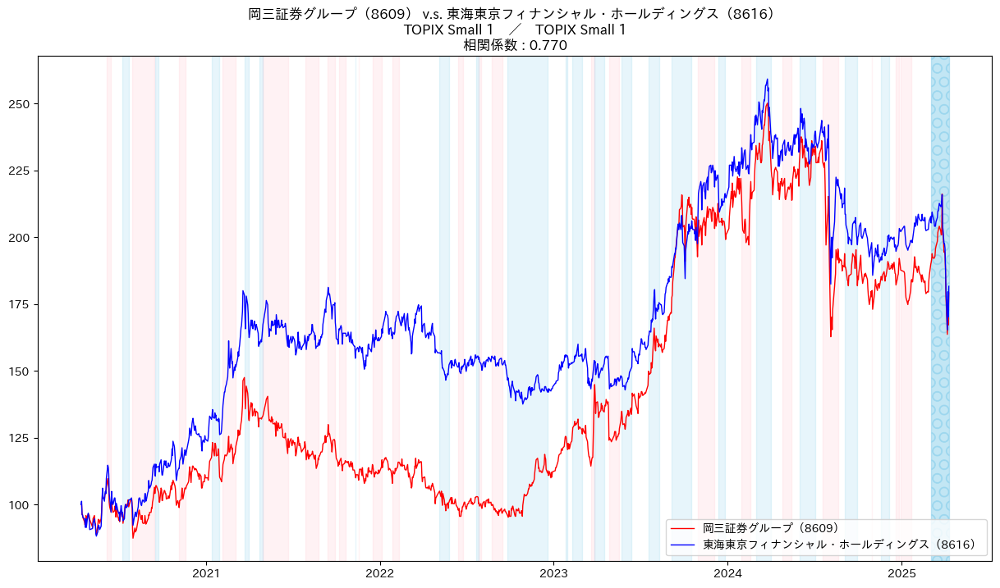

date_hlf_idx :  20


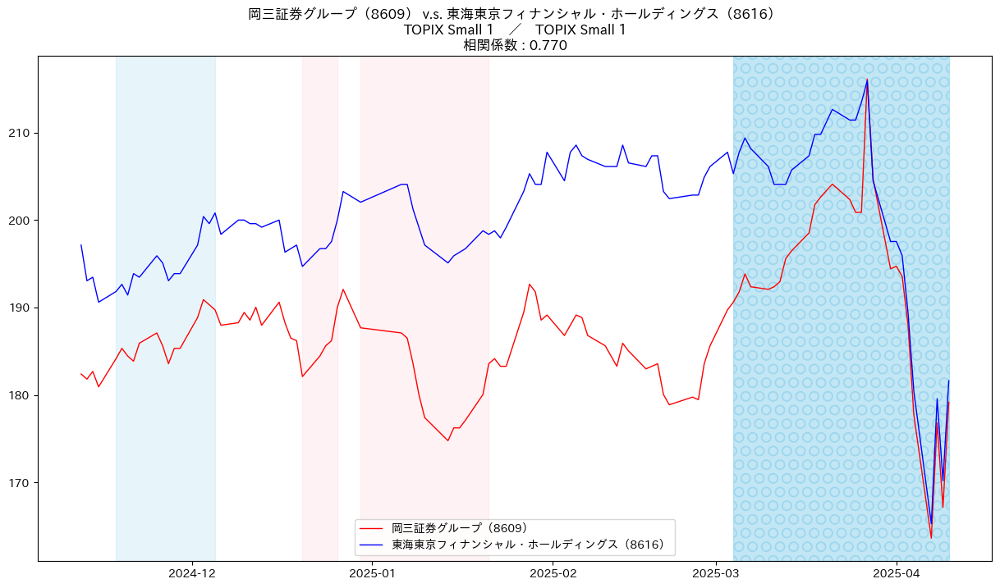

date_hlf_idx :  20


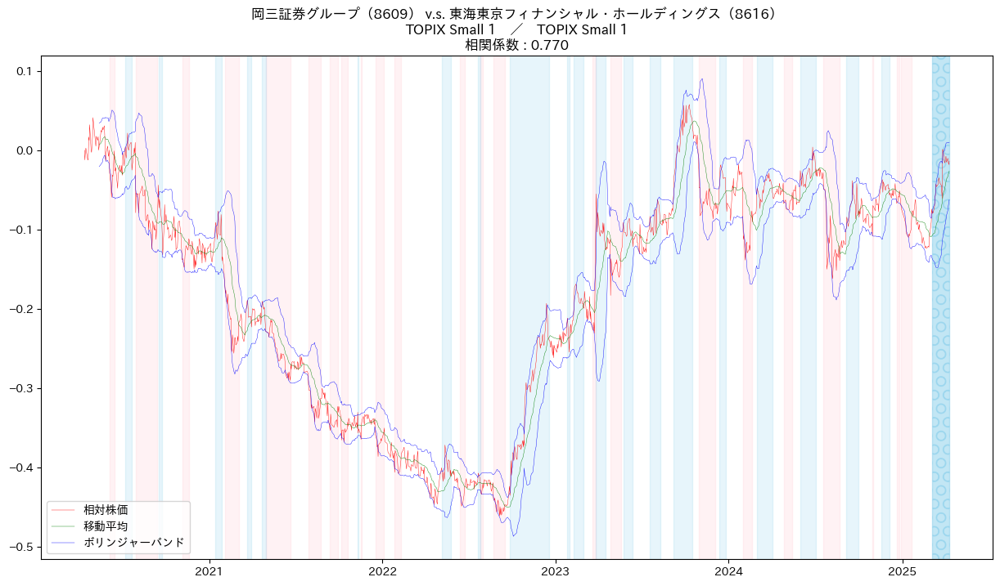

date_hlf_idx :  20


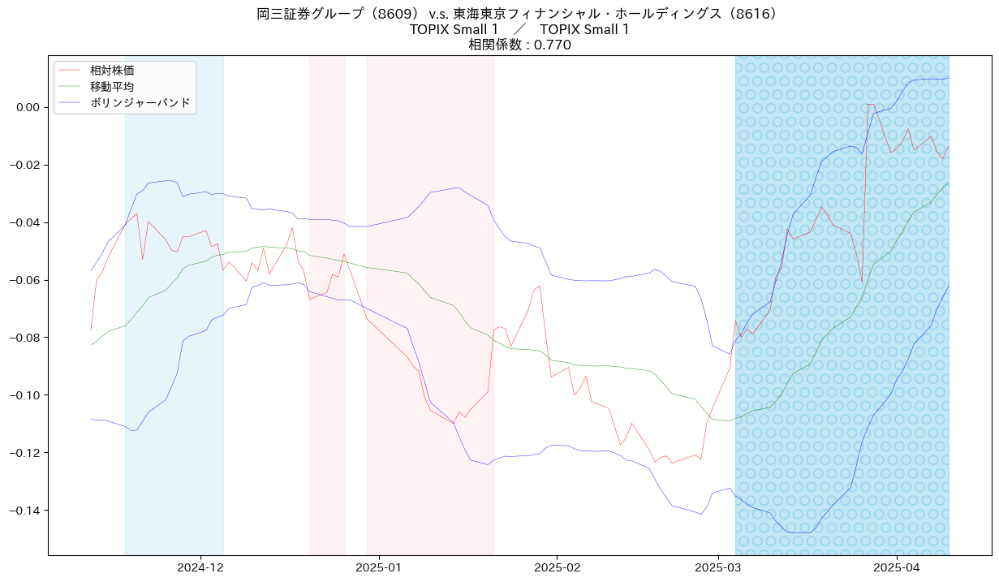

date_hlf_idx :  20


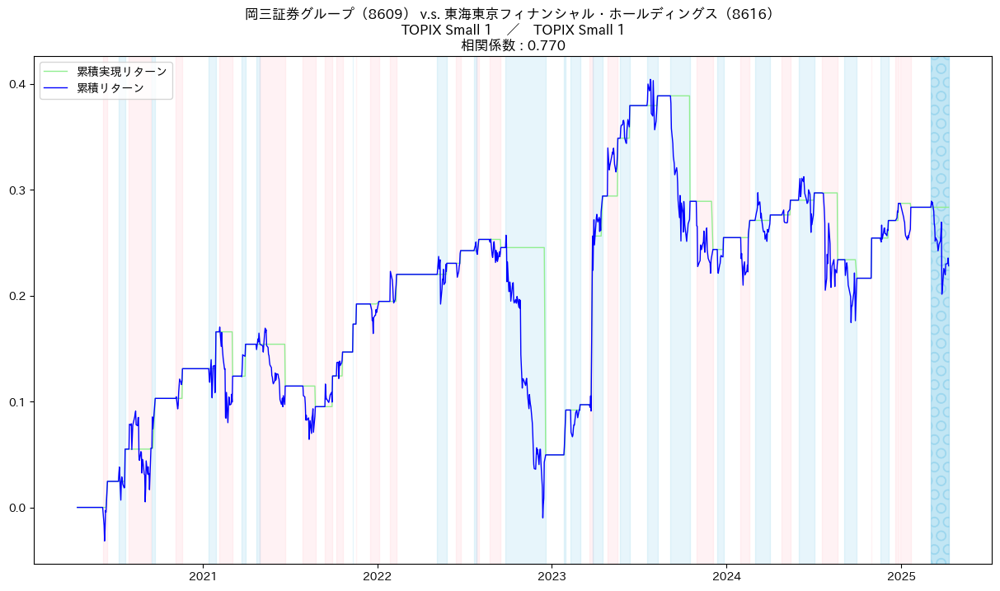

date_hlf_idx :  20


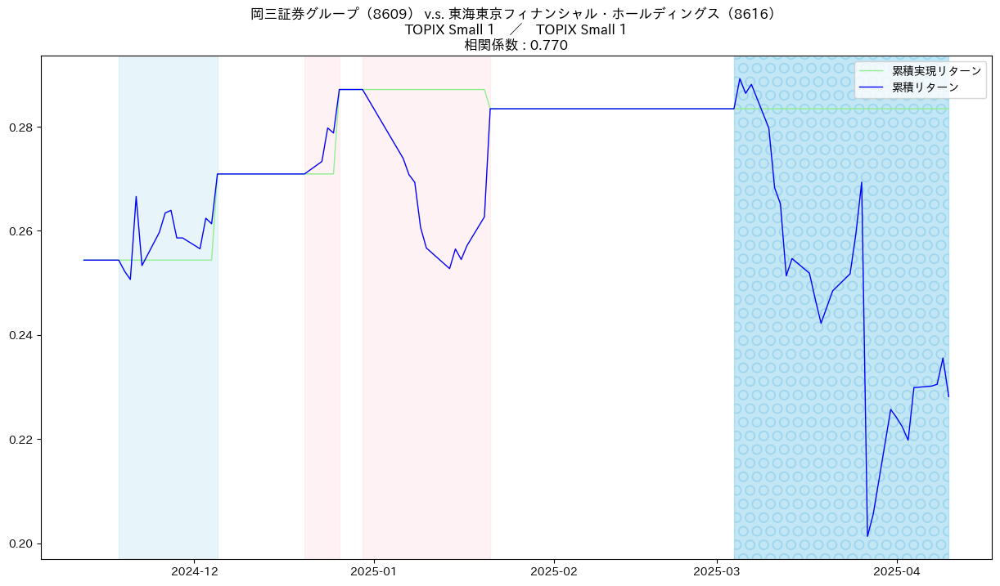

's_one_corr : '

Code0                      8601
CompanyName0         大和証券グループ本社
ScaleCategory0     TOPIX Mid400
Code1                      8604
CompanyName1         野村ホールディングス
ScaleCategory1    TOPIX Large70
Corr                   0.750647
Name: 1, dtype: object

{'Code0': '8601',
 'Code1': '8604',
 'CompanyName0': '大和証券グループ本社',
 'CompanyName1': '野村ホールディングス',
 'Corr': 0.7506474475431457,
 'ScaleCategory0': 'TOPIX Mid400',
 'ScaleCategory1': 'TOPIX Large70'}


date_hlf_idx :  24


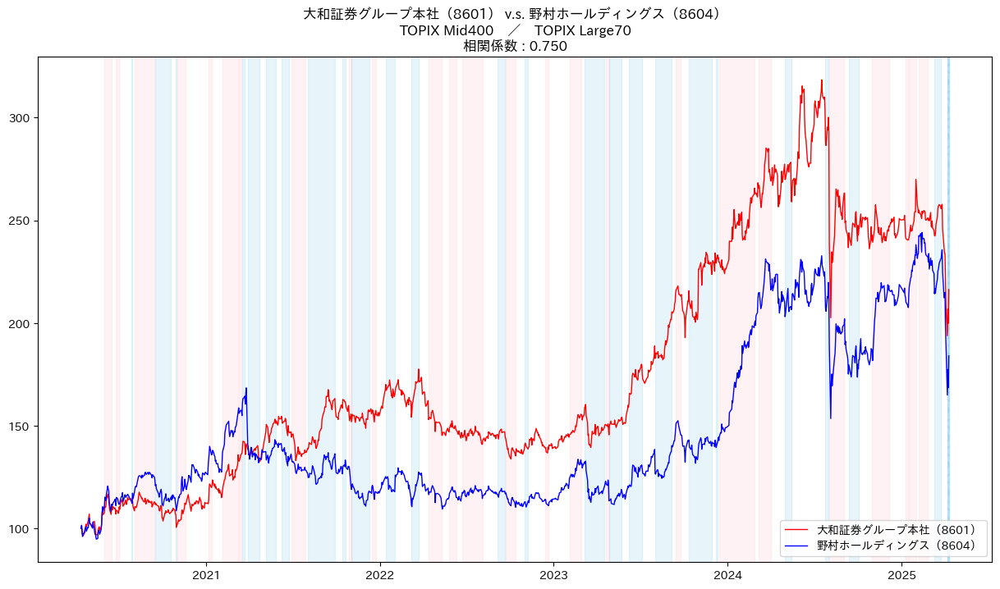

date_hlf_idx :  24


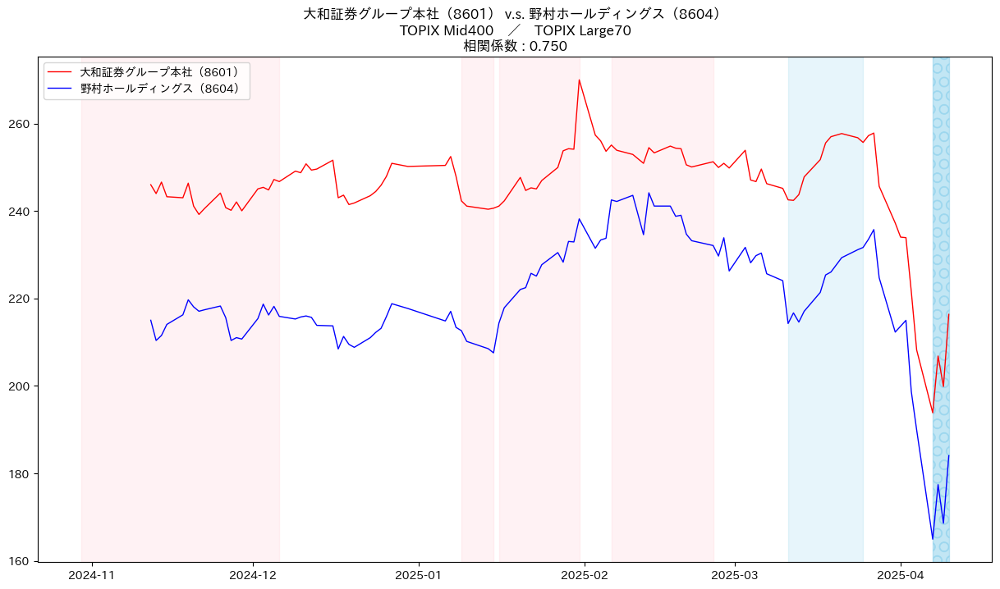

date_hlf_idx :  24


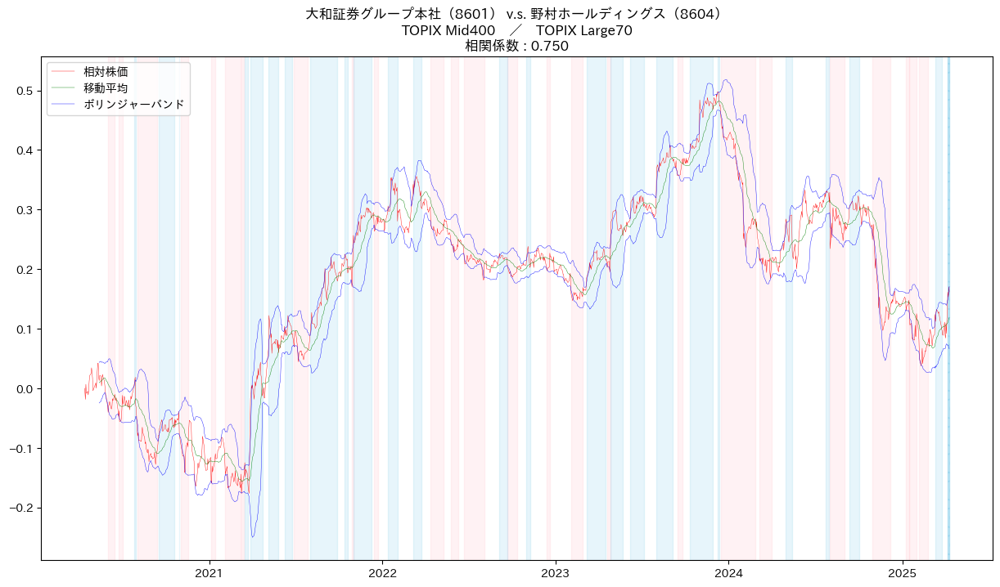

date_hlf_idx :  24


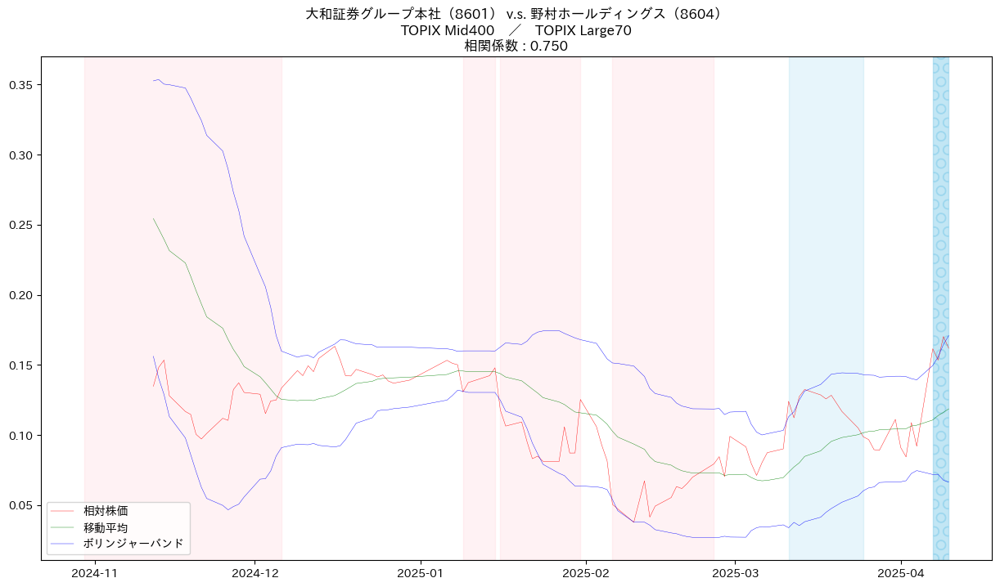

date_hlf_idx :  24


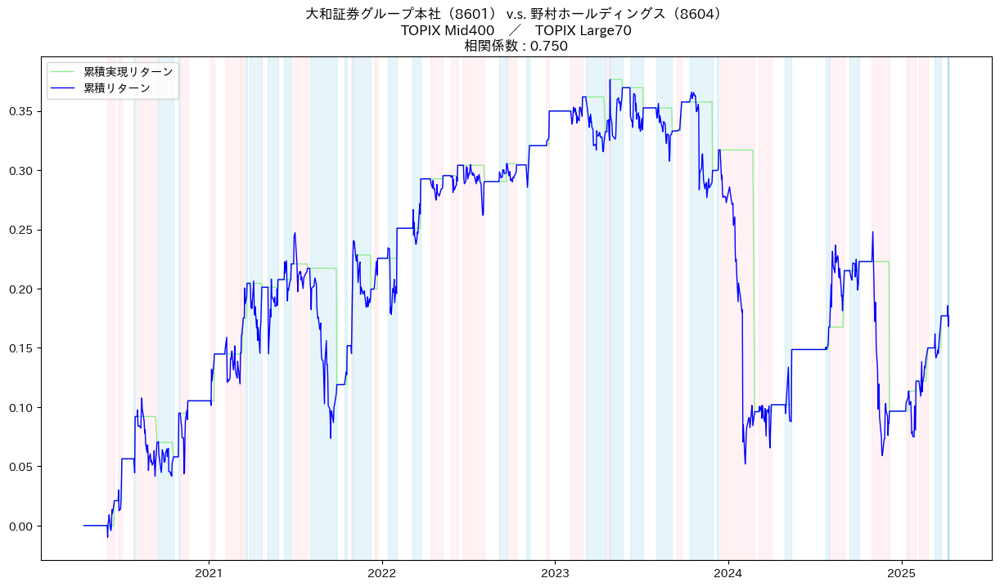

date_hlf_idx :  24


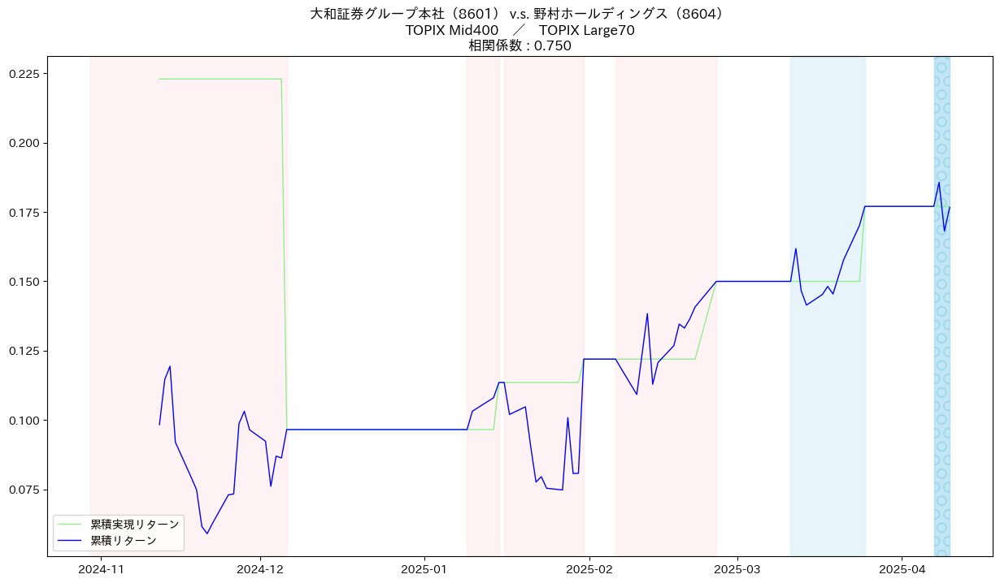

's_one_corr : '

Code0                             8601
CompanyName0                大和証券グループ本社
ScaleCategory0            TOPIX Mid400
Code1                             8616
CompanyName1      東海東京フィナンシャル・ホールディングス
ScaleCategory1           TOPIX Small 1
Corr                          0.737874
Name: 2, dtype: object

{'Code0': '8601',
 'Code1': '8616',
 'CompanyName0': '大和証券グループ本社',
 'CompanyName1': '東海東京フィナンシャル・ホールディングス',
 'Corr': 0.737873508075516,
 'ScaleCategory0': 'TOPIX Mid400',
 'ScaleCategory1': 'TOPIX Small 1'}


date_hlf_idx :  21


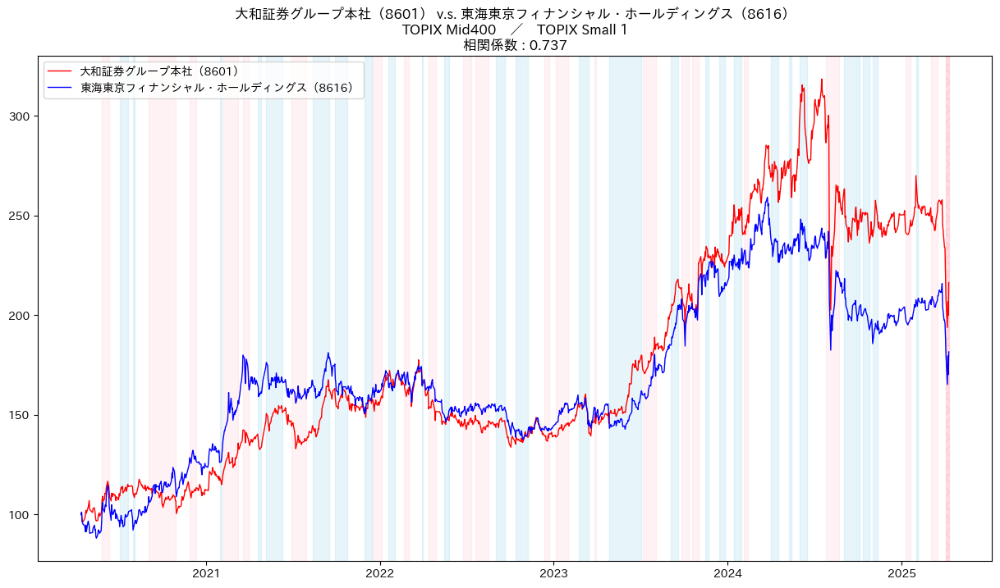

date_hlf_idx :  21


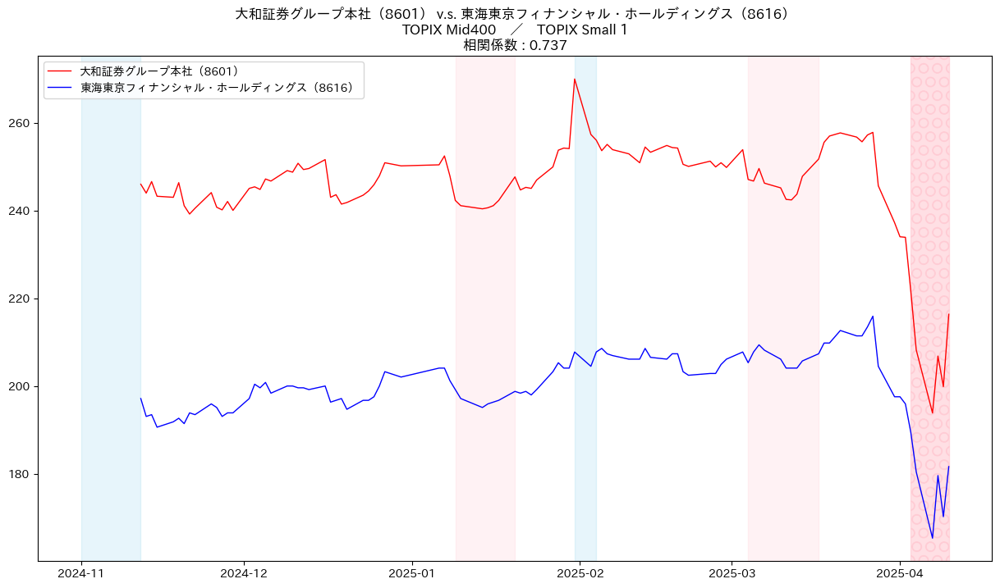

date_hlf_idx :  21


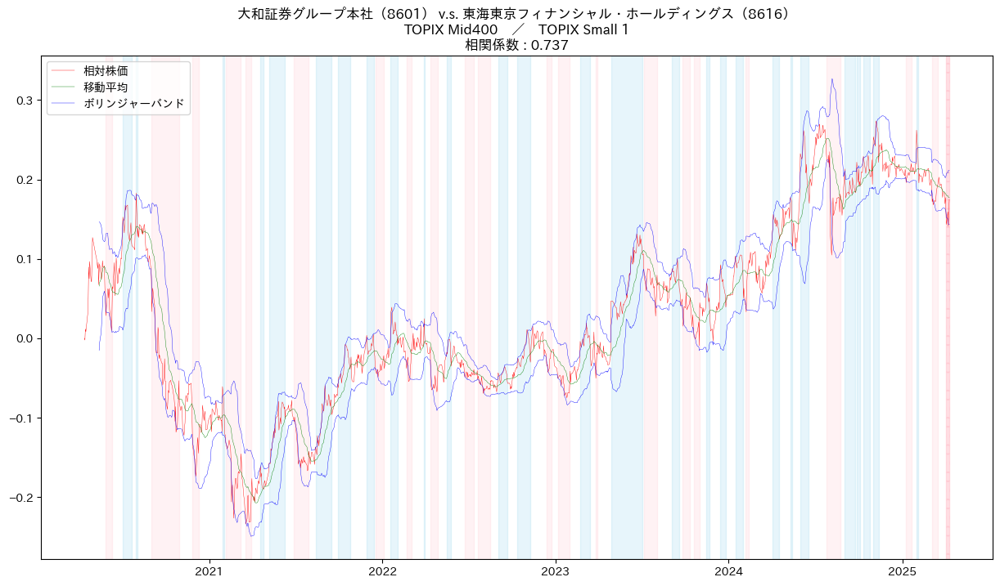

date_hlf_idx :  21


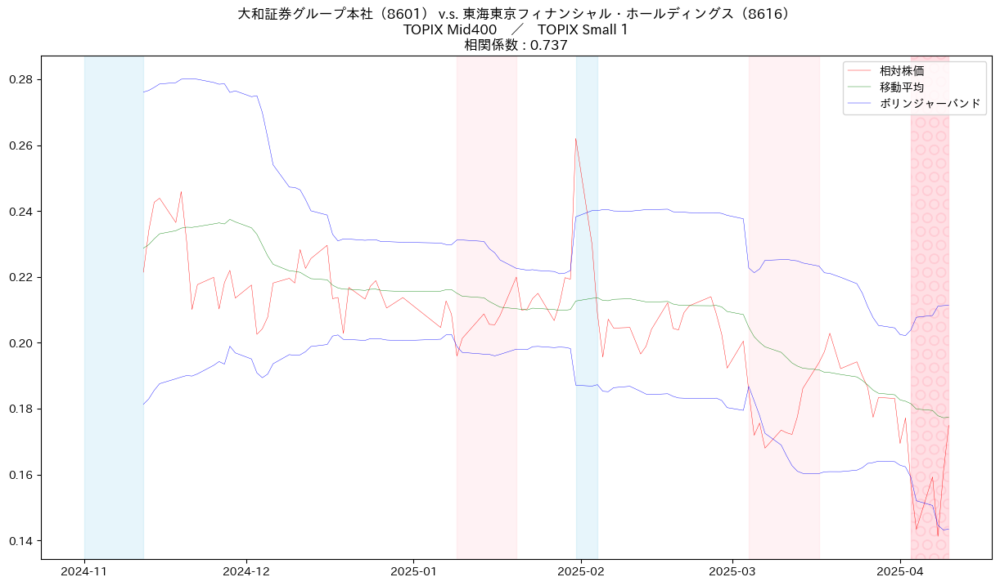

date_hlf_idx :  21


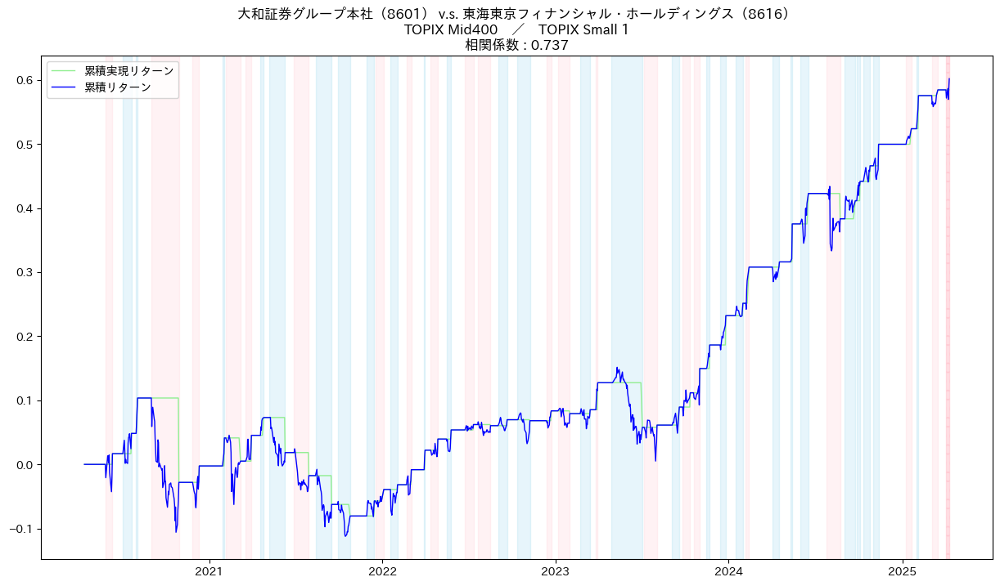

date_hlf_idx :  21


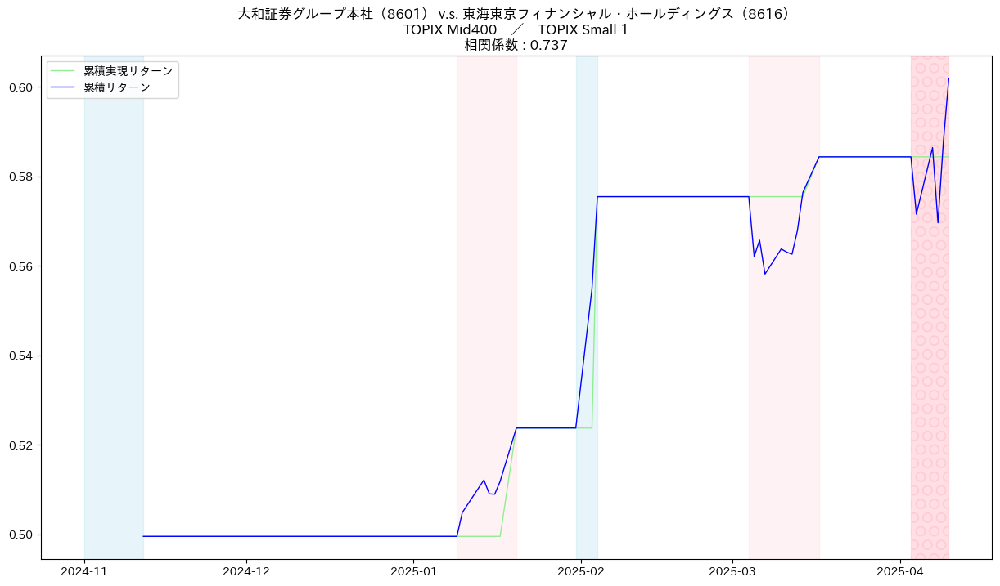

's_one_corr : '

Code0                             8616
CompanyName0      東海東京フィナンシャル・ホールディングス
ScaleCategory0           TOPIX Small 1
Code1                             8624
CompanyName1                    いちよし証券
ScaleCategory1           TOPIX Small 2
Corr                          0.729182
Name: 3, dtype: object

{'Code0': '8616',
 'Code1': '8624',
 'CompanyName0': '東海東京フィナンシャル・ホールディングス',
 'CompanyName1': 'いちよし証券',
 'Corr': 0.7291821104083568,
 'ScaleCategory0': 'TOPIX Small 1',
 'ScaleCategory1': 'TOPIX Small 2'}


date_hlf_idx :  24


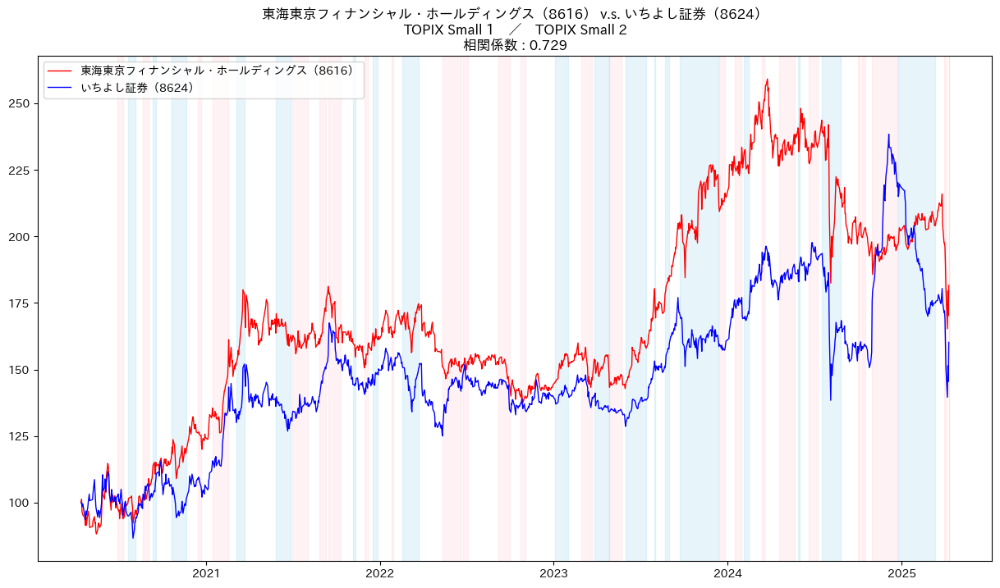

date_hlf_idx :  24


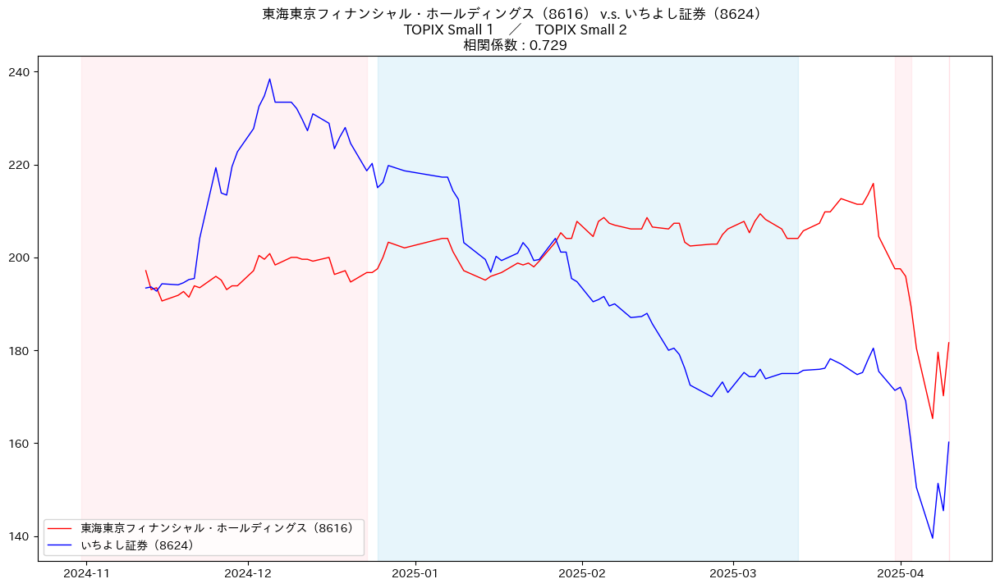

date_hlf_idx :  24


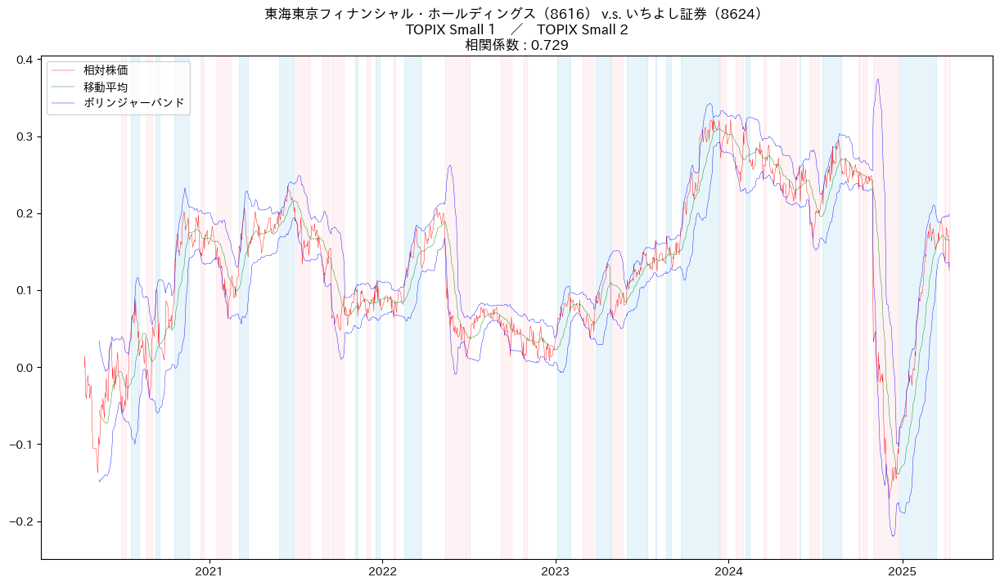

date_hlf_idx :  24


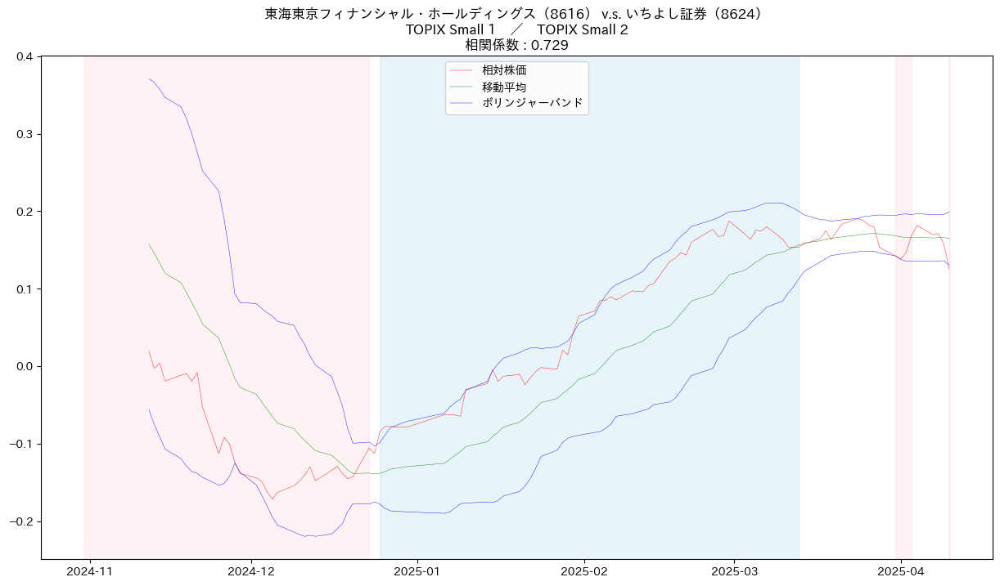

date_hlf_idx :  24


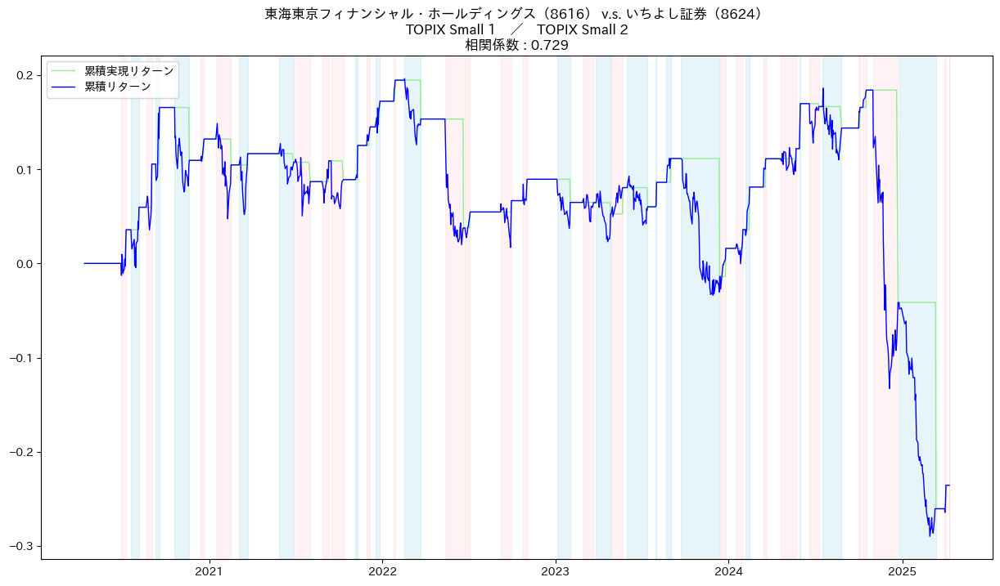

date_hlf_idx :  24


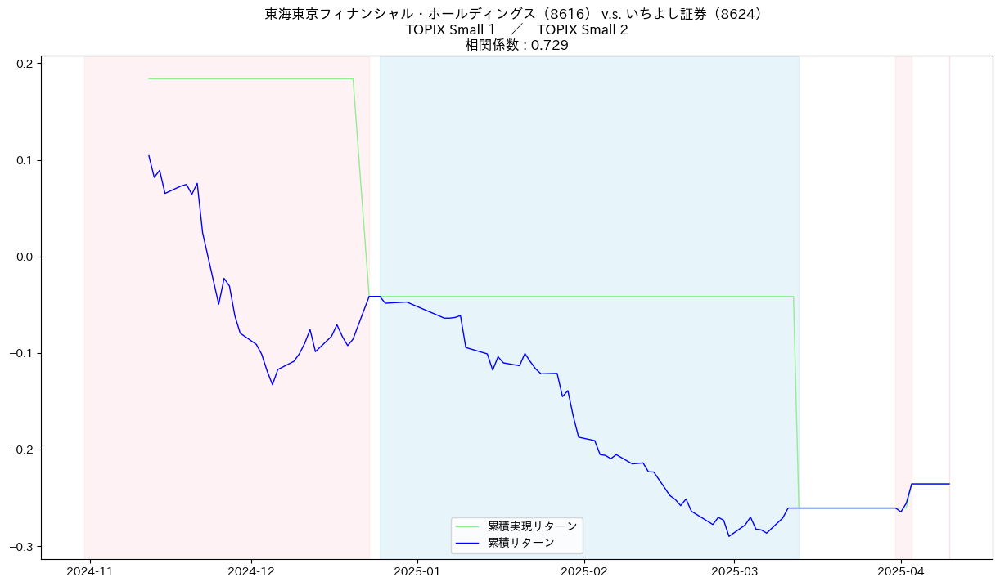

's_one_corr : '

Code0                             8616
CompanyName0      東海東京フィナンシャル・ホールディングス
ScaleCategory0           TOPIX Small 1
Code1                             8707
CompanyName1             岩井コスモホールディングス
ScaleCategory1           TOPIX Small 2
Corr                          0.692529
Name: 4, dtype: object

{'Code0': '8616',
 'Code1': '8707',
 'CompanyName0': '東海東京フィナンシャル・ホールディングス',
 'CompanyName1': '岩井コスモホールディングス',
 'Corr': 0.6925288291664813,
 'ScaleCategory0': 'TOPIX Small 1',
 'ScaleCategory1': 'TOPIX Small 2'}


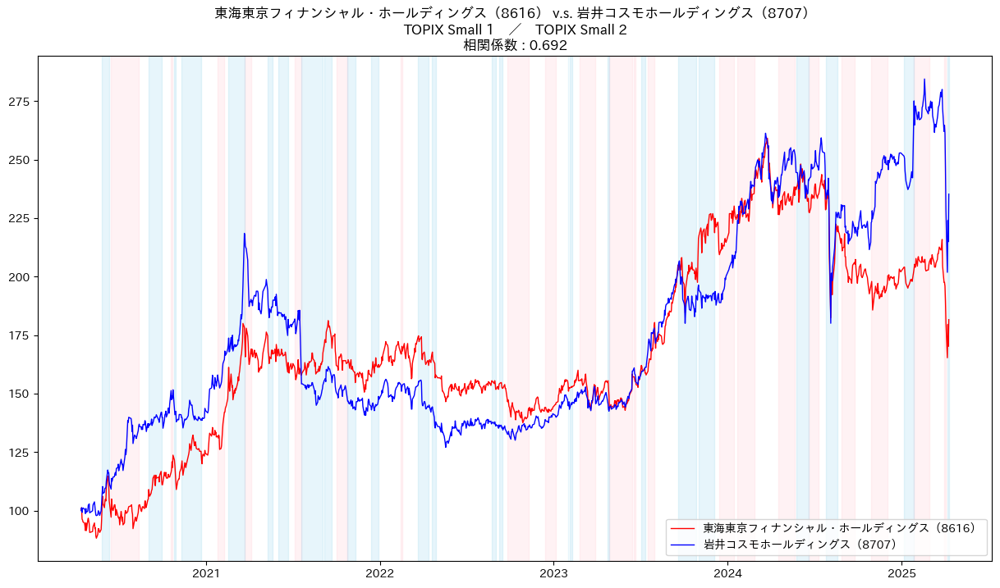

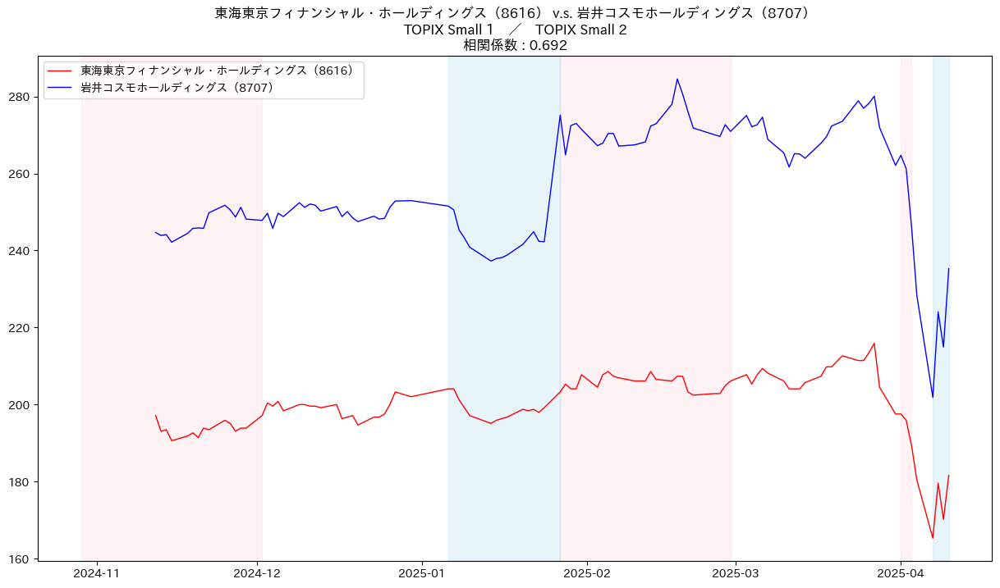

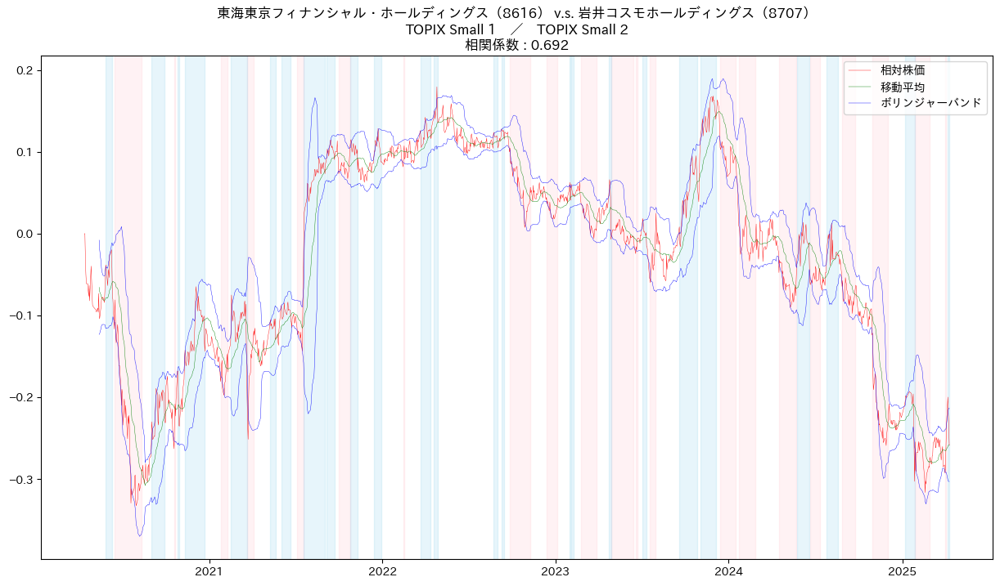

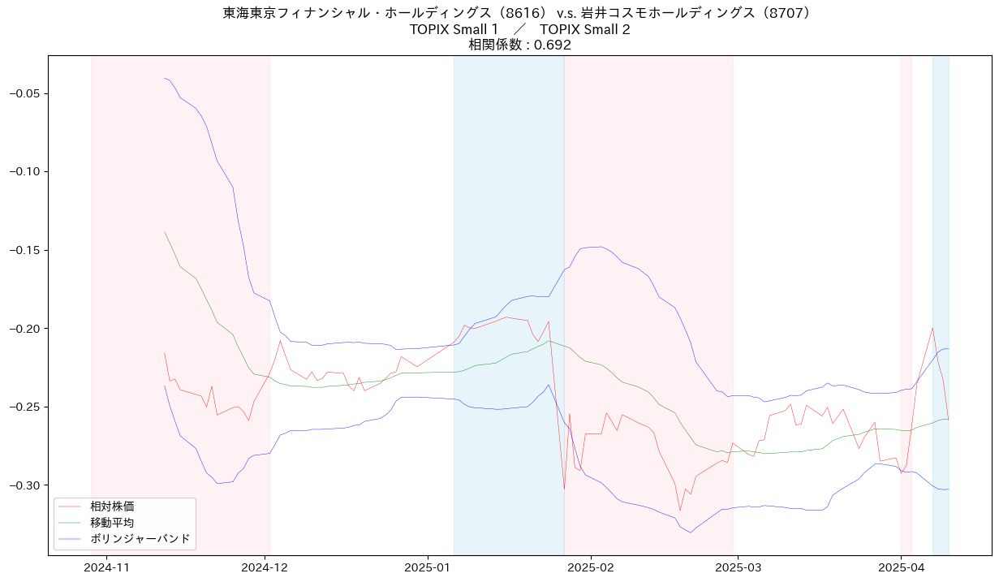

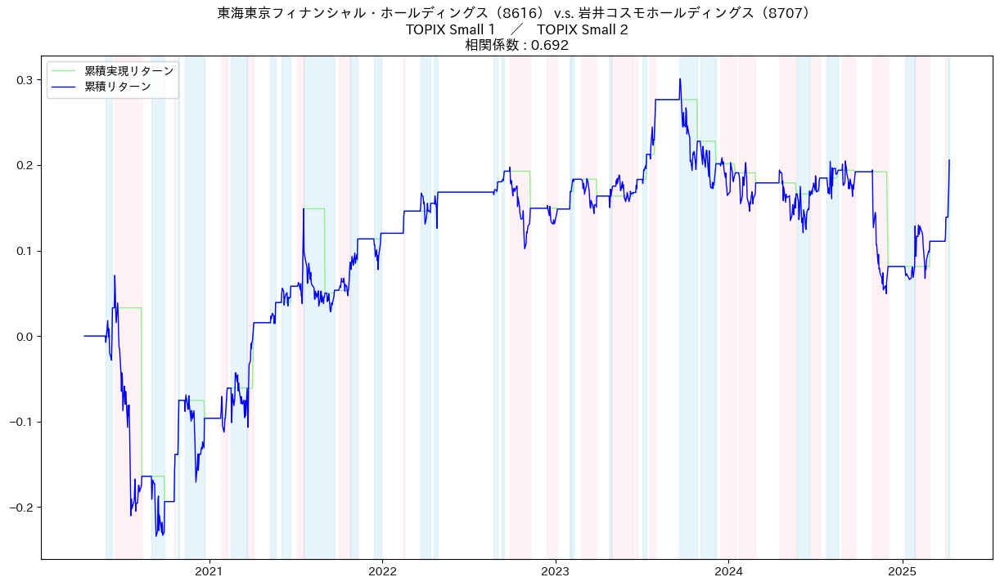

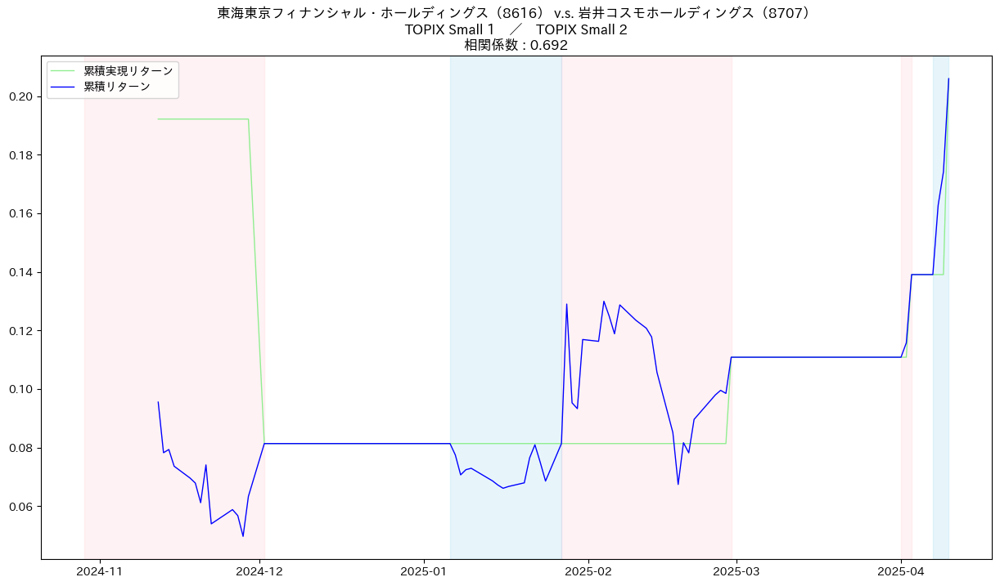

's_one_corr : '

Code0                      8624
CompanyName0             いちよし証券
ScaleCategory0    TOPIX Small 2
Code1                      8707
CompanyName1      岩井コスモホールディングス
ScaleCategory1    TOPIX Small 2
Corr                   0.685775
Name: 5, dtype: object

{'Code0': '8624',
 'Code1': '8707',
 'CompanyName0': 'いちよし証券',
 'CompanyName1': '岩井コスモホールディングス',
 'Corr': 0.6857745915640209,
 'ScaleCategory0': 'TOPIX Small 2',
 'ScaleCategory1': 'TOPIX Small 2'}


date_hlf_idx :  19


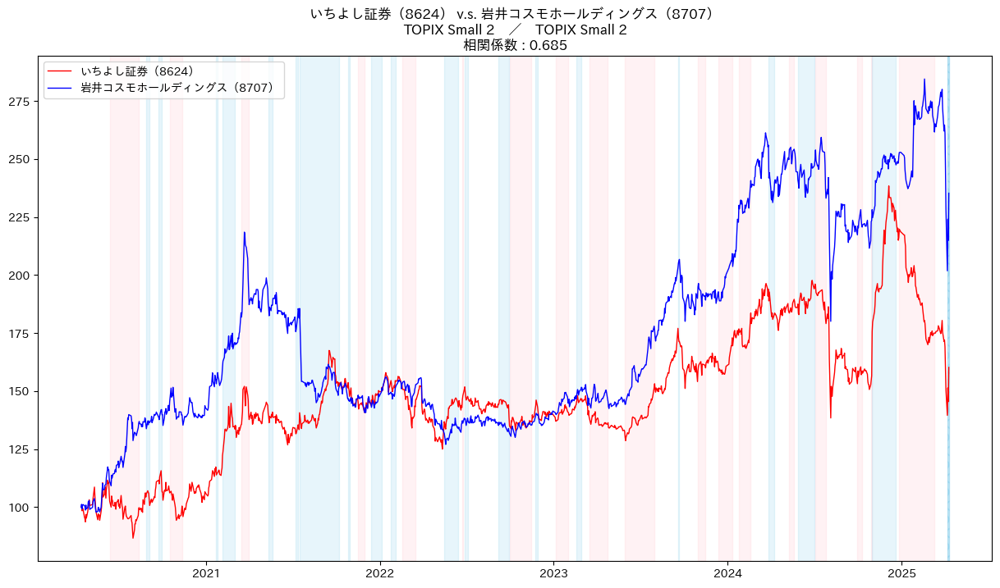

date_hlf_idx :  19


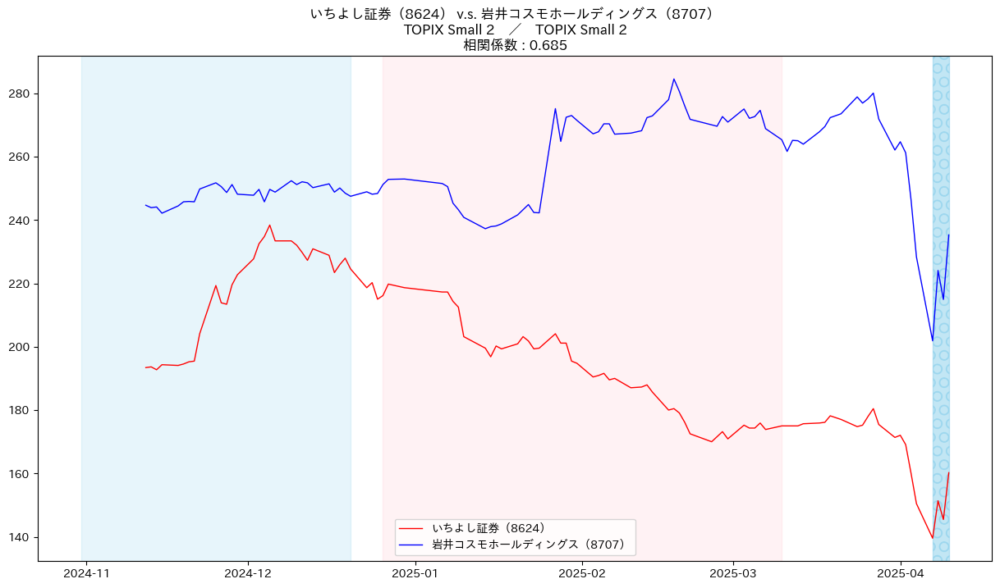

date_hlf_idx :  19


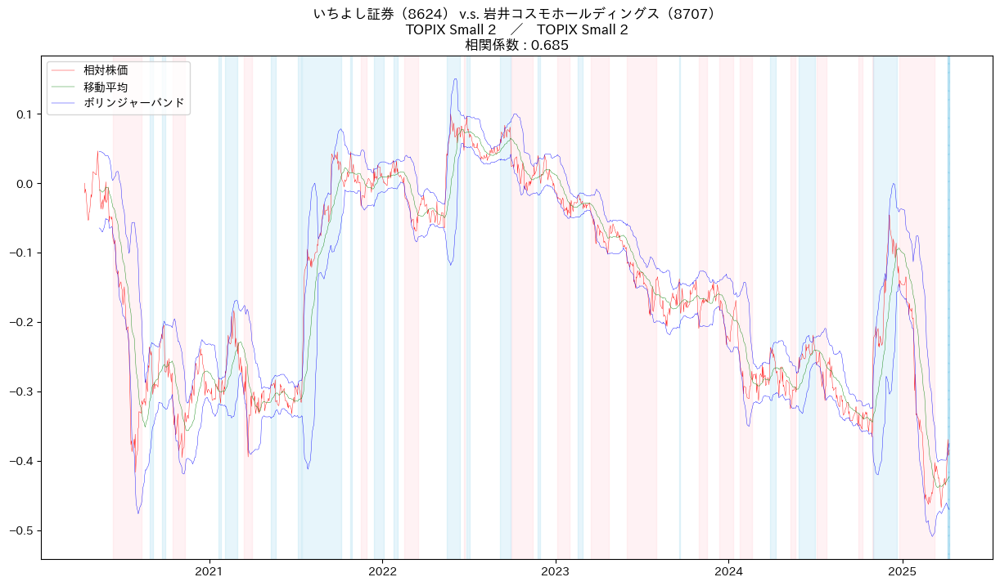

date_hlf_idx :  19


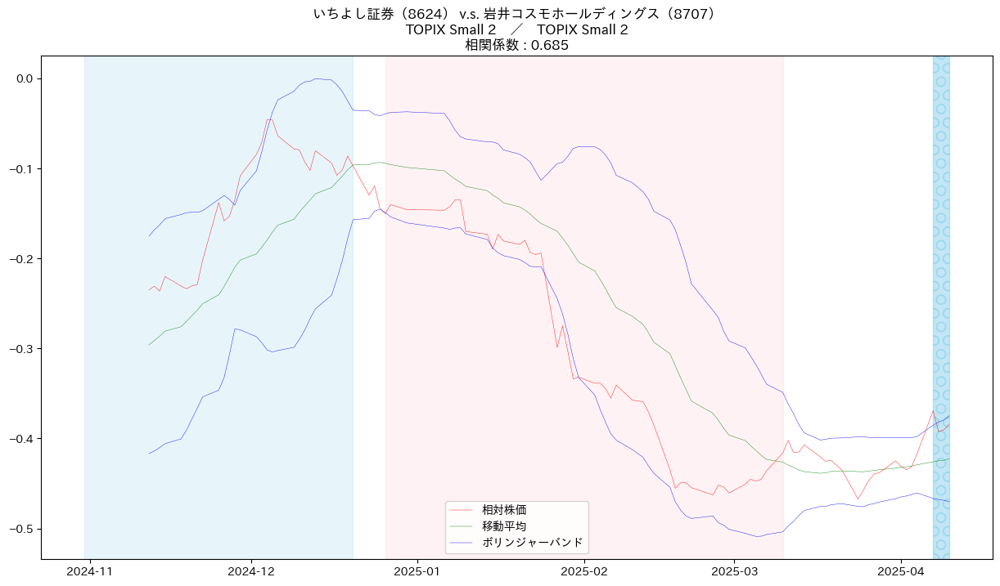

date_hlf_idx :  19


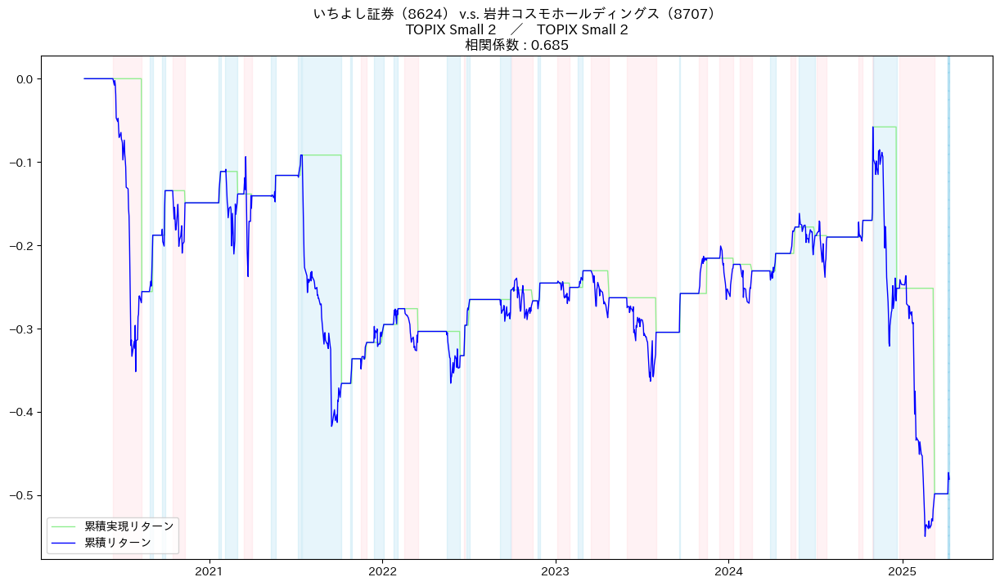

date_hlf_idx :  19


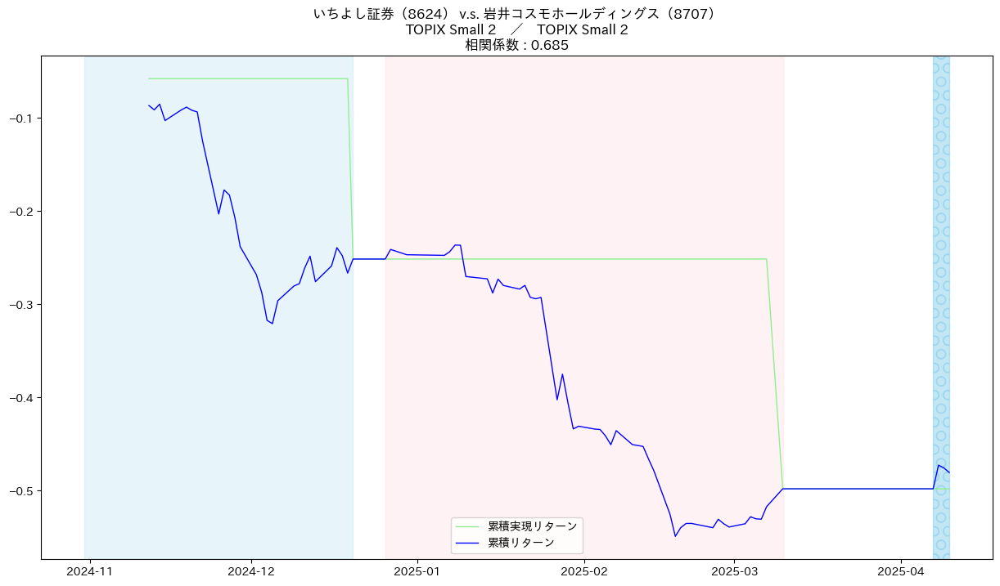

Sector33Code  Sector33CodeName
5250          情報･通信業              637
9050          サービス業               582
9999          その他                 444
6100          小売業                 352
6050          卸売業                 309
                                 ... 
0050          水産・農林業               12
5100          海運業                  11
3300          石油･石炭製品              11
1050          鉱業                    5
5150          空運業                   5
Length: 34, dtype: int64


'df_prices : '

,Date,Code,Open,High,Low,Close,UpperLimit,LowerLimit,Volume,TurnoverValue,AdjustmentFactor,AdjustmentOpen,AdjustmentHigh,AdjustmentLow,AdjustmentClose,AdjustmentVolume
253376,2024-04-01,167A,3700.0,3790.0,3400.0,3500.0,0,0,412700.0,1474353500.0,1.0,3700.0,3790.0,3400.0,3500.0,412700.0
253377,2024-04-02,167A,3470.0,3480.0,3140.0,3250.0,0,0,454300.0,1475335000.0,1.0,3470.0,3480.0,3140.0,3250.0,454300.0
253378,2024-04-03,167A,3065.0,3145.0,2981.0,3050.0,0,0,587400.0,1782784400.0,1.0,3065.0,3145.0,2981.0,3050.0,587400.0
253379,2024-04-04,167A,3080.0,3125.0,3000.0,3020.0,0,0,366300.0,1112652500.0,1.0,3080.0,3125.0,3000.0,3020.0,366300.0
253380,2024-04-05,167A,2988.0,3030.0,2965.0,3030.0,0,0,202300.0,605377000.0,1.0,2988.0,3030.0,2965.0,3030.0,202300.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5152204,2025-04-04,9991,987.0,991.0,947.0,970.0,0,0,125900.0,122135500.0,1.0,987.0,991.0,947.0,970.0,125900.0
5152205,2025-04-07,9991,920.0,934.0,901.0,915.0,0,0,147700.0,135717200.0,1.0,920.0,934.0,901.0,915.0,147700.0
5152206,2025-04-08,9991,945.0,965.0,940.0,960.0,0,0,89700.0,85681900.0,1.0,945.0,965.0,940.0,960.0,89700.0
5152207,2025-04-09,9991,945.0,945.0,924.0,940.0,0,0,48200.0,45122300.0,1.0,945.0,945.0,924.0,940.0,48200.0


,2676,2692,2733,2737,2760,2767,2768,2784,2874,3023,...,9902,9932,9934,9960,9962,9987,9991,7128,7130,167A
Date,,,,,,,,,,,,,,,,,,,,,
2020-04-13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-04-14,0.869565,1.149425,1.501155,-0.724638,1.315789,1.875000,1.204819,0.779102,0.564334,-0.600240,...,0.301659,0.539892,-0.264667,0.168634,3.521127,0.965018,-0.127065,NaN,NaN,NaN
2020-04-15,-2.478448,-4.090909,-1.365188,-1.605839,0.610390,-0.613497,-0.793651,-1.000455,-2.918070,-0.724638,...,-2.857143,-1.789976,-2.786378,-0.050505,1.960784,-1.433692,-2.926209,NaN,NaN,NaN
2020-04-16,0.220994,4.028436,2.652826,2.373887,1.368272,4.938272,-1.200000,0.183739,3.121387,3.284672,...,8.255934,6.196841,2.001820,0.892707,-4.434851,-0.363636,6.684142,NaN,NaN,NaN
2020-04-17,-0.661521,0.000000,-2.921348,-0.434783,1.069655,-2.647059,2.429150,-1.237964,-1.569507,-2.709069,...,-1.191611,-2.116705,-0.981267,-1.786311,3.860370,-0.851582,-1.351351,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-04-04,-5.960265,-0.797872,-3.782895,-7.407407,-5.725971,-2.907640,-3.423367,-0.217918,-2.542373,-4.474432,...,-5.102041,-8.020050,-3.281801,-6.908463,-2.052910,0.581275,-4.055391,-4.585153,-4.358759,-4.110169
2025-04-07,-9.577465,-3.619303,-4.444444,-8.000000,-11.822126,-14.268937,-9.723577,-6.236350,-4.596273,-8.401487,...,-6.451613,-6.993642,-5.524397,-5.426716,-14.131374,-7.120743,-5.670103,-7.139588,-6.617003,-6.142289
2025-04-08,7.320872,4.728790,5.187835,6.086957,7.831078,16.095890,6.862392,2.795031,5.989583,7.224026,...,5.993432,7.617188,4.452360,9.857773,6.618017,2.222222,4.918033,5.372104,6.335054,4.943503


len(df_corr) :  8001


,Code0,CompanyName0,ScaleCategory0,Code1,CompanyName1,ScaleCategory1,Corr
0,8031,三井物産,TOPIX Core30,8053,住友商事,TOPIX Large70,0.845187
1,8002,丸紅,TOPIX Large70,8053,住友商事,TOPIX Large70,0.844169
2,8031,三井物産,TOPIX Core30,8058,三菱商事,TOPIX Core30,0.824719
3,8053,住友商事,TOPIX Large70,8058,三菱商事,TOPIX Core30,0.823907
4,8002,丸紅,TOPIX Large70,8031,三井物産,TOPIX Core30,0.819228
5,8001,伊藤忠商事,TOPIX Core30,8053,住友商事,TOPIX Large70,0.797490
6,8002,丸紅,TOPIX Large70,8058,三菱商事,TOPIX Core30,0.789878
7,2768,双日,TOPIX Mid400,8053,住友商事,TOPIX Large70,0.779408
8,2768,双日,TOPIX Mid400,8002,丸紅,TOPIX Large70,0.772132
9,8001,伊藤忠商事,TOPIX Core30,8031,三井物産,TOPIX Core30,0.757926


,Code0,CompanyName0,ScaleCategory0,Code1,CompanyName1,ScaleCategory1,Corr
7991,3038,神戸物産,TOPIX Mid400,8078,阪和興業,TOPIX Small 1,0.030559
7992,3038,神戸物産,TOPIX Mid400,8093,極東貿易,TOPIX Small 2,0.026669
7993,3038,神戸物産,TOPIX Mid400,8031,三井物産,TOPIX Core30,0.024103
7994,3038,神戸物産,TOPIX Mid400,8020,兼松,TOPIX Mid400,0.022639
7995,3023,ラサ商事,TOPIX Small 2,3038,神戸物産,TOPIX Mid400,0.018021
7996,2768,双日,TOPIX Mid400,3038,神戸物産,TOPIX Mid400,0.017857
7997,3038,神戸物産,TOPIX Mid400,7420,佐鳥電機,TOPIX Small 2,0.016449
7998,3038,神戸物産,TOPIX Mid400,8058,三菱商事,TOPIX Core30,0.013415
7999,3038,神戸物産,TOPIX Mid400,8053,住友商事,TOPIX Large70,0.010408
8000,3038,神戸物産,TOPIX Mid400,8002,丸紅,TOPIX Large70,0.002016


's_one_corr : '

Code0                      8031
CompanyName0               三井物産
ScaleCategory0     TOPIX Core30
Code1                      8053
CompanyName1               住友商事
ScaleCategory1    TOPIX Large70
Corr                   0.845187
Name: 0, dtype: object

{'Code0': '8031',
 'Code1': '8053',
 'CompanyName0': '三井物産',
 'CompanyName1': '住友商事',
 'Corr': 0.8451874212406454,
 'ScaleCategory0': 'TOPIX Core30',
 'ScaleCategory1': 'TOPIX Large70'}


date_hlf_idx :  24


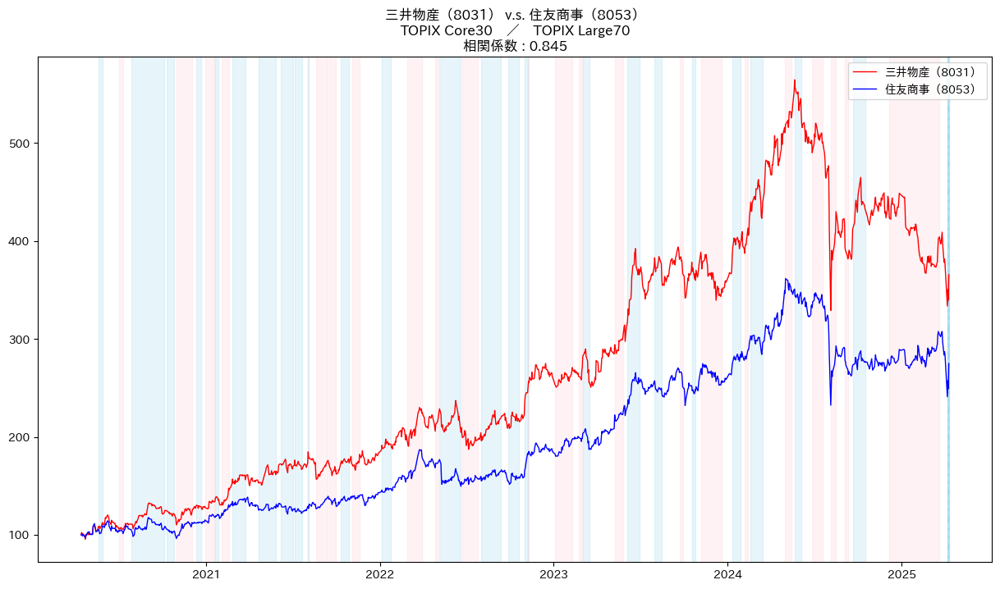

date_hlf_idx :  24


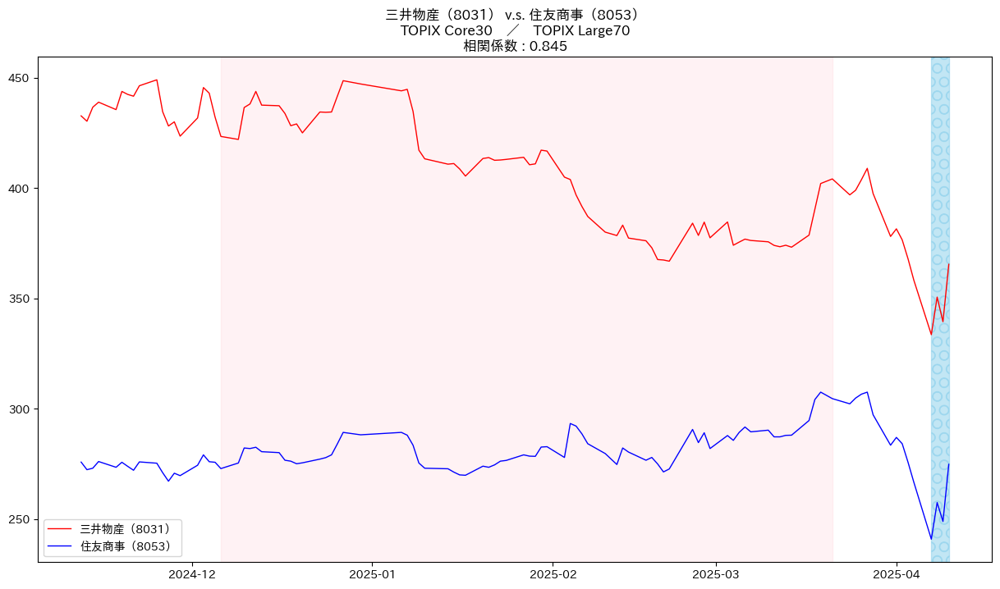

date_hlf_idx :  24


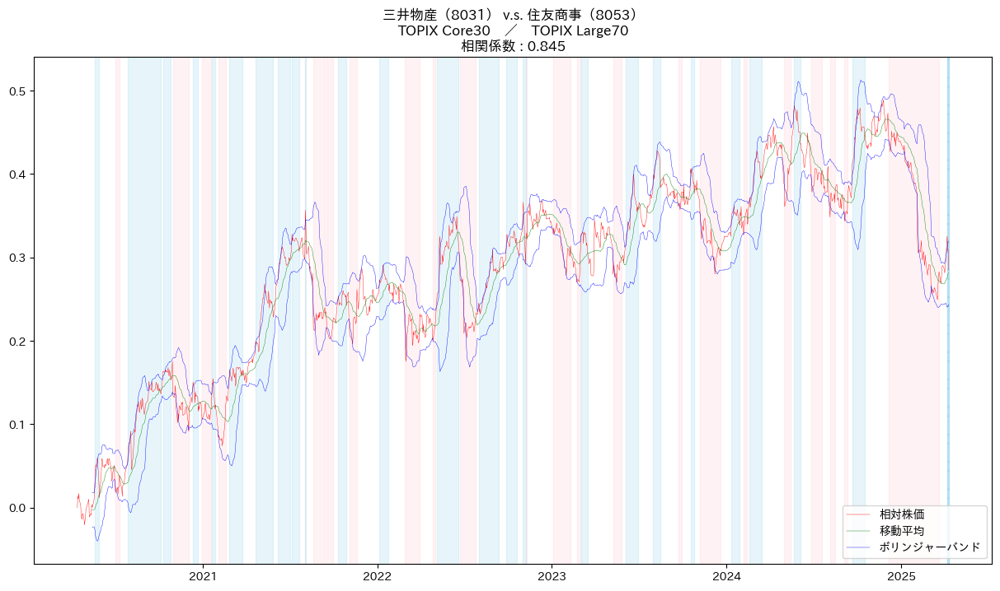

date_hlf_idx :  24


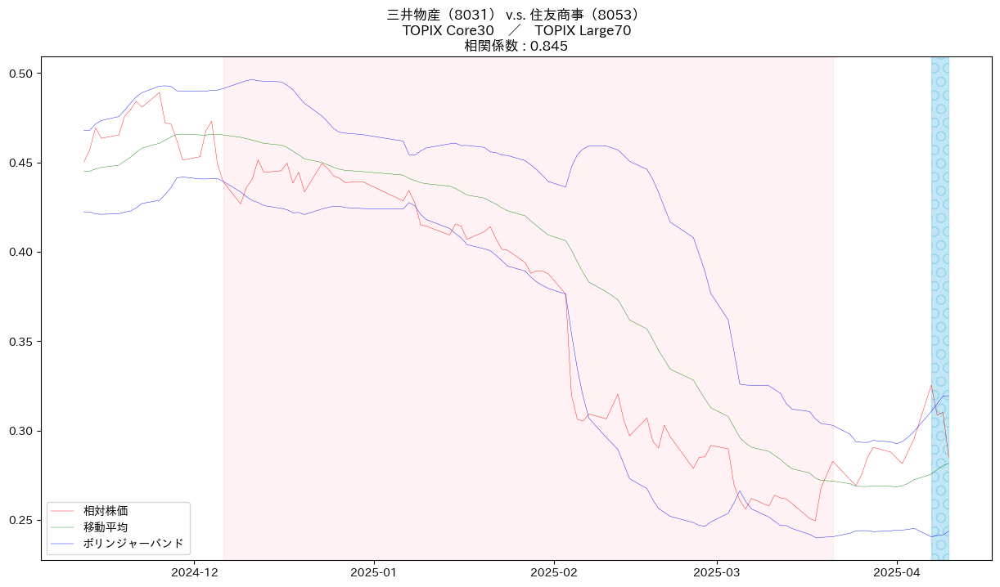

date_hlf_idx :  24


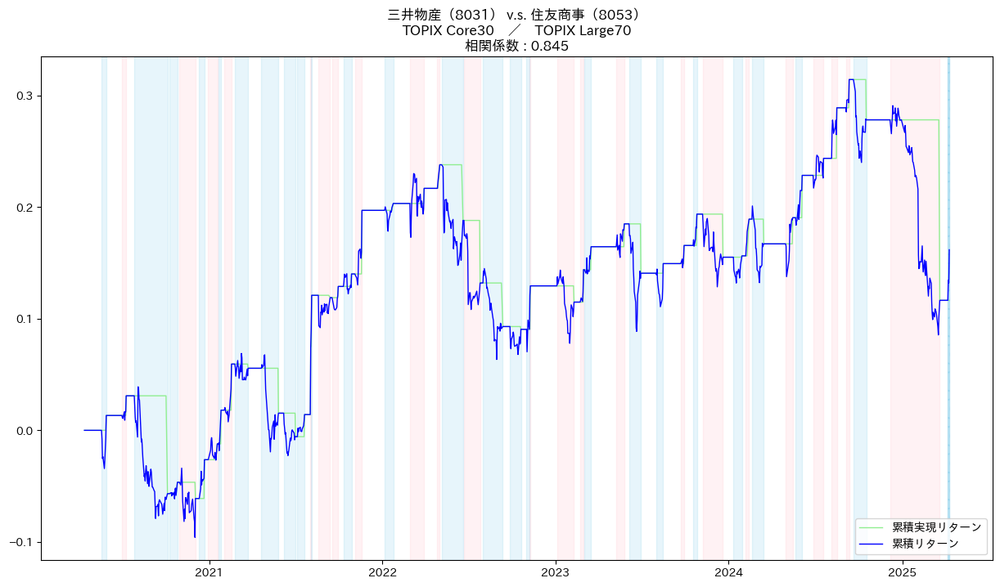

date_hlf_idx :  24


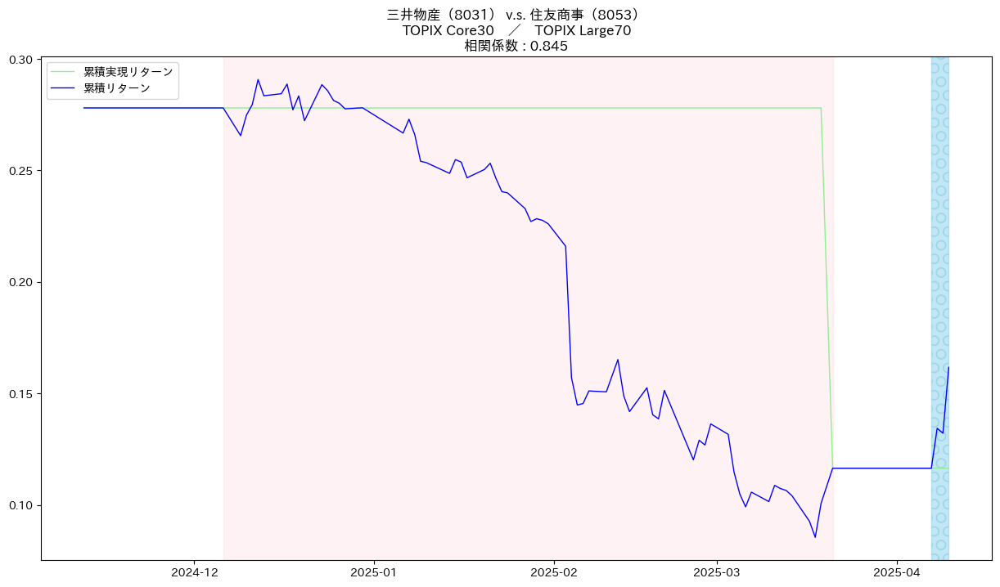

's_one_corr : '

Code0                      8002
CompanyName0                 丸紅
ScaleCategory0    TOPIX Large70
Code1                      8053
CompanyName1               住友商事
ScaleCategory1    TOPIX Large70
Corr                   0.844169
Name: 1, dtype: object

{'Code0': '8002',
 'Code1': '8053',
 'CompanyName0': '丸紅',
 'CompanyName1': '住友商事',
 'Corr': 0.8441687455356373,
 'ScaleCategory0': 'TOPIX Large70',
 'ScaleCategory1': 'TOPIX Large70'}


date_hlf_idx :  19


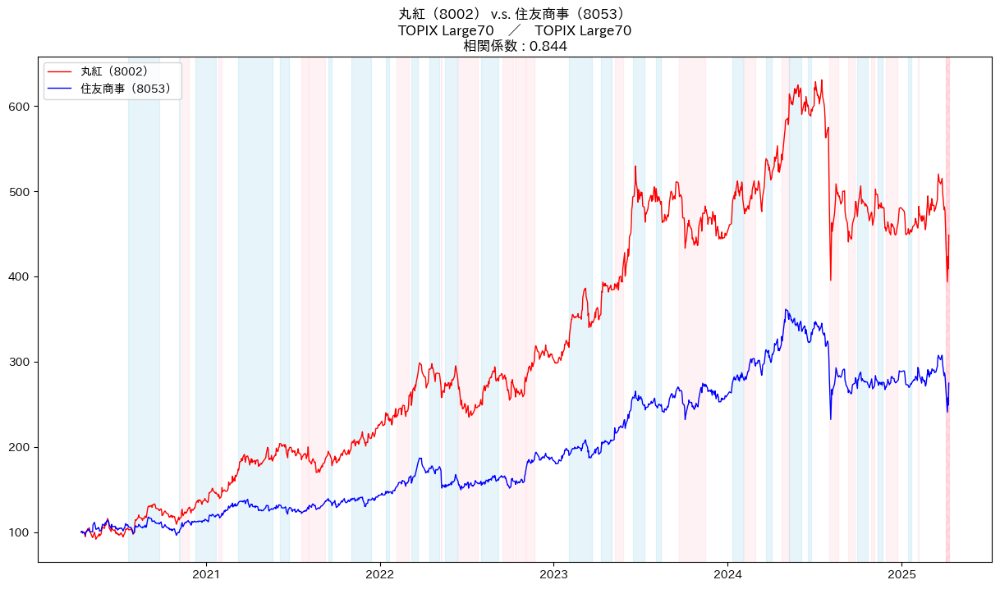

date_hlf_idx :  19


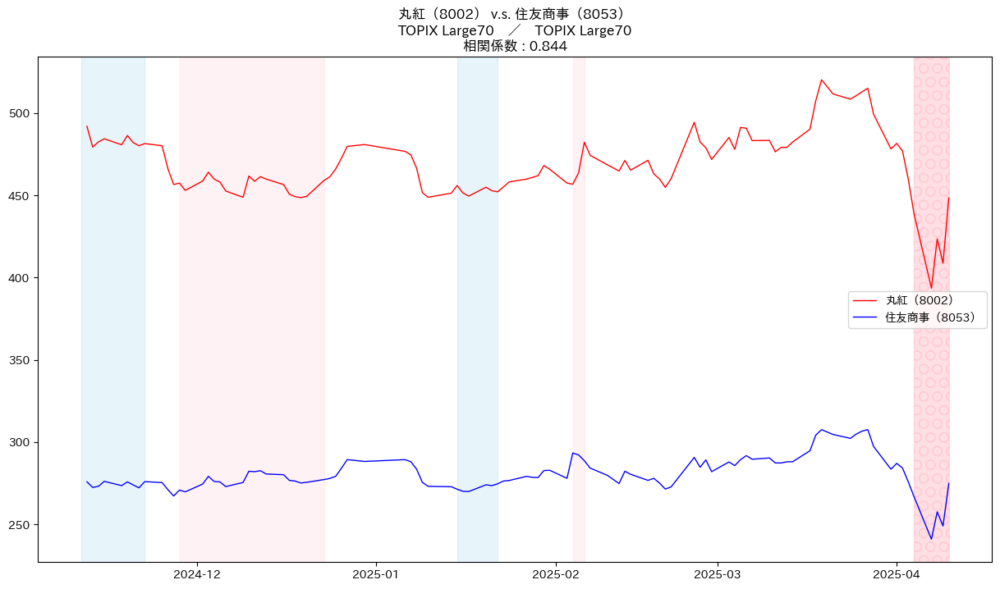

date_hlf_idx :  19


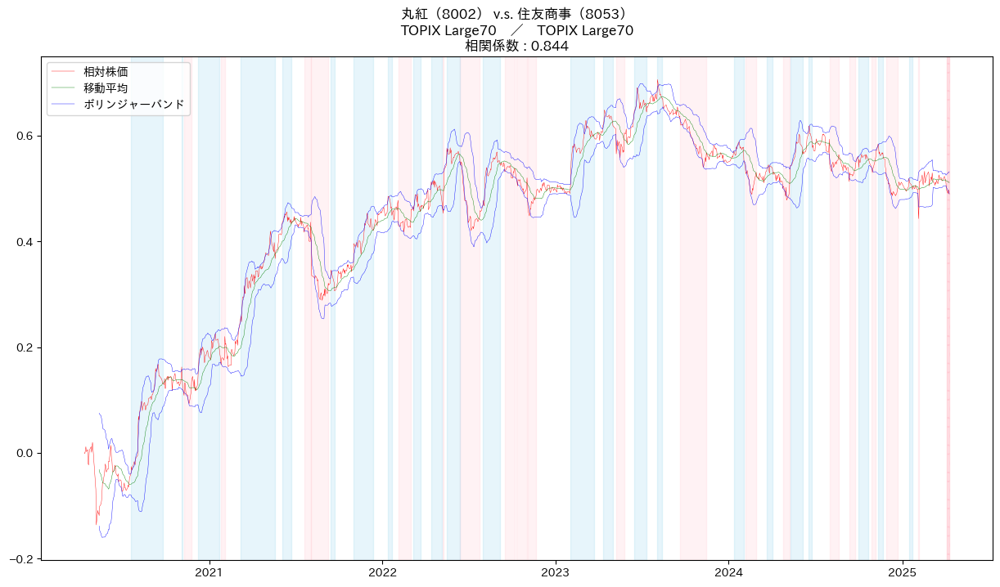

date_hlf_idx :  19


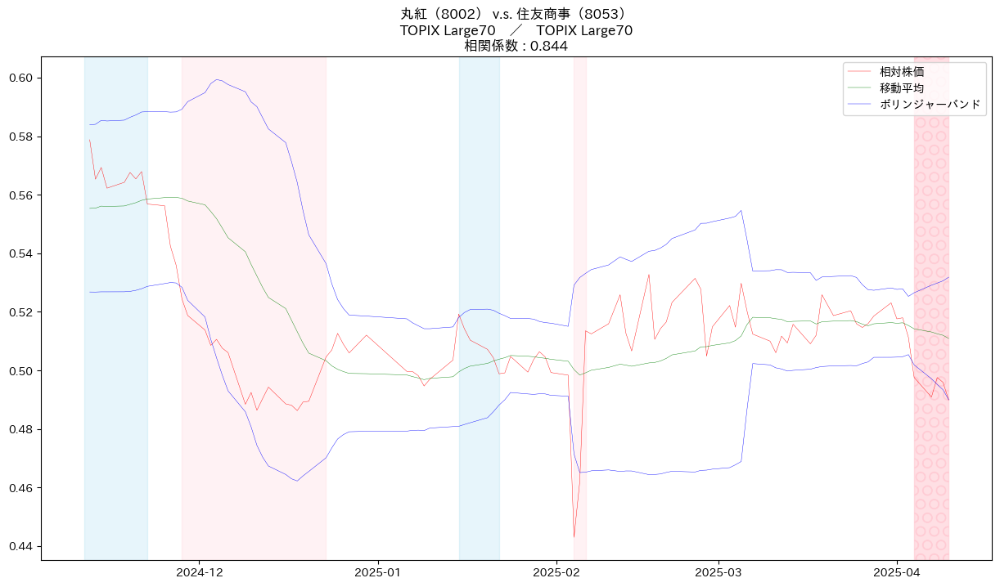

date_hlf_idx :  19


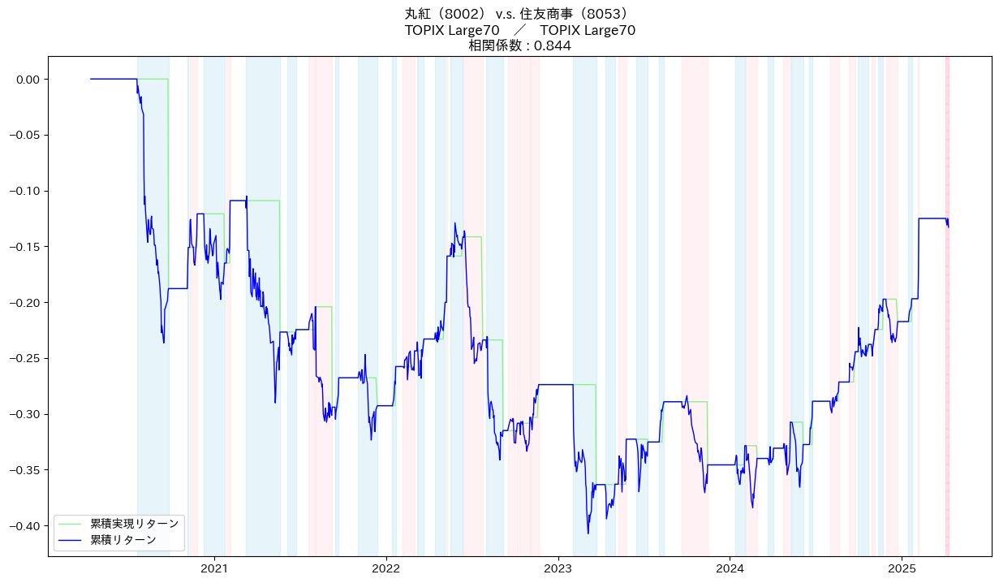

date_hlf_idx :  19


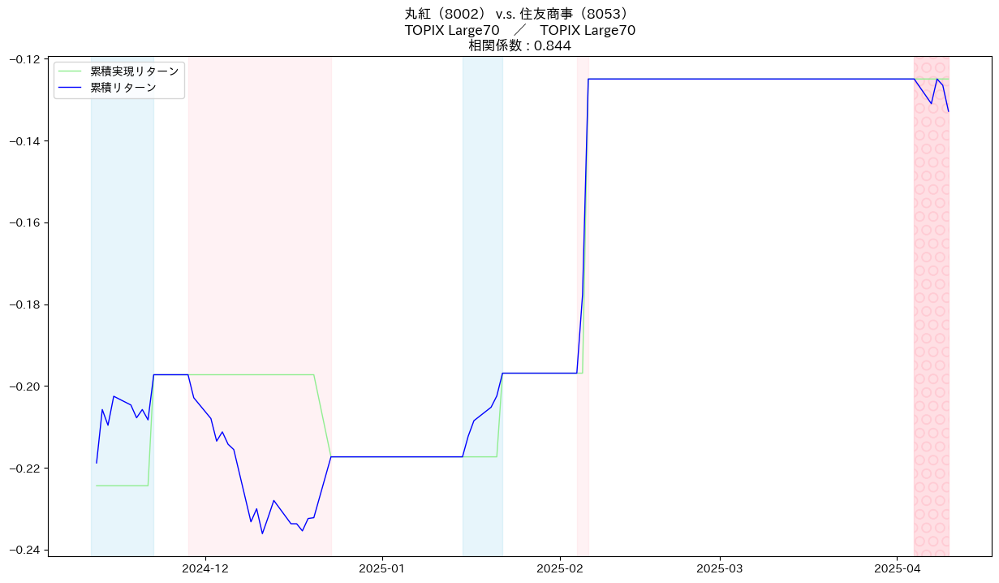

's_one_corr : '

Code0                     8031
CompanyName0              三井物産
ScaleCategory0    TOPIX Core30
Code1                     8058
CompanyName1              三菱商事
ScaleCategory1    TOPIX Core30
Corr                  0.824719
Name: 2, dtype: object

{'Code0': '8031',
 'Code1': '8058',
 'CompanyName0': '三井物産',
 'CompanyName1': '三菱商事',
 'Corr': 0.8247190803976476,
 'ScaleCategory0': 'TOPIX Core30',
 'ScaleCategory1': 'TOPIX Core30'}


date_hlf_idx :  20


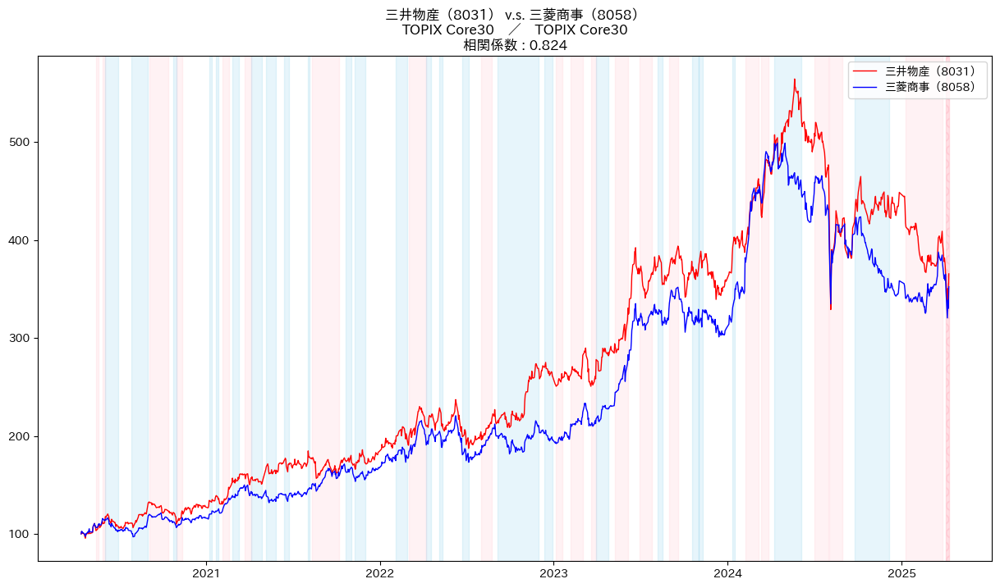

date_hlf_idx :  20


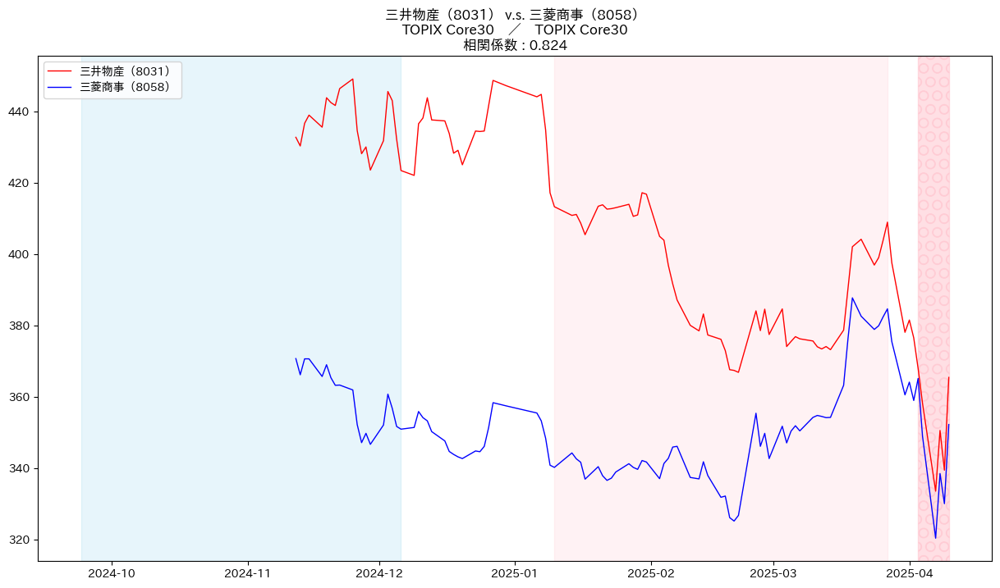

date_hlf_idx :  20


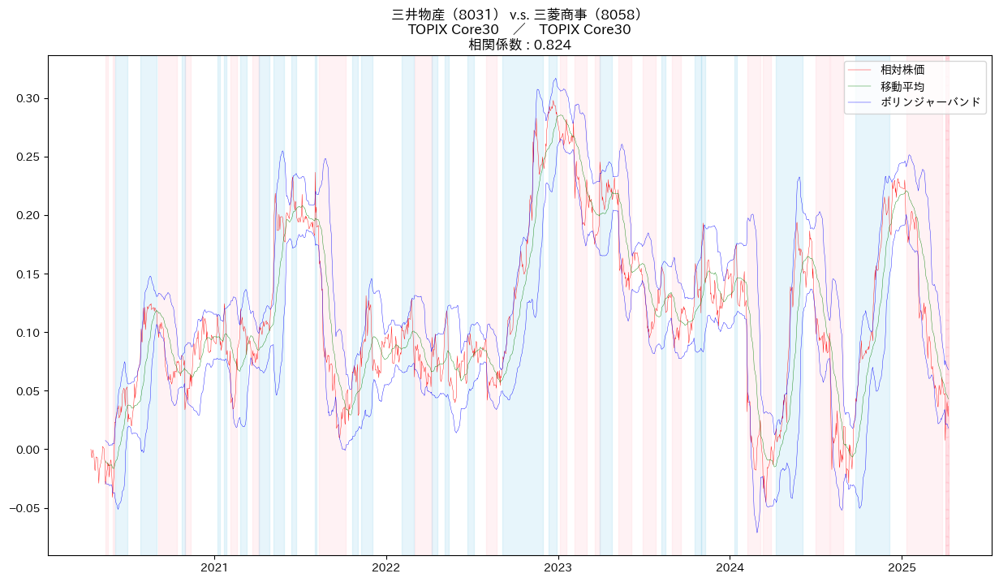

date_hlf_idx :  20


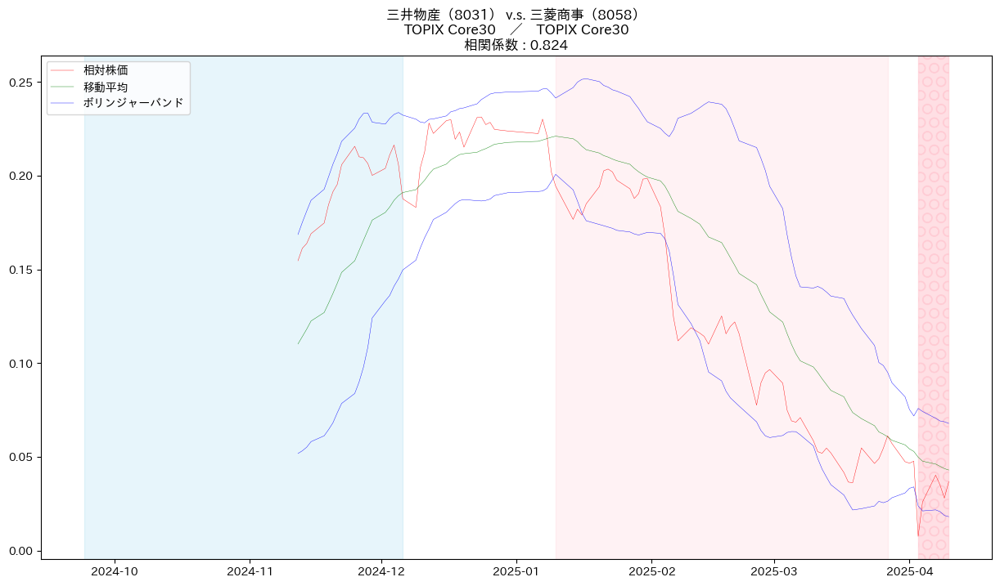

date_hlf_idx :  20


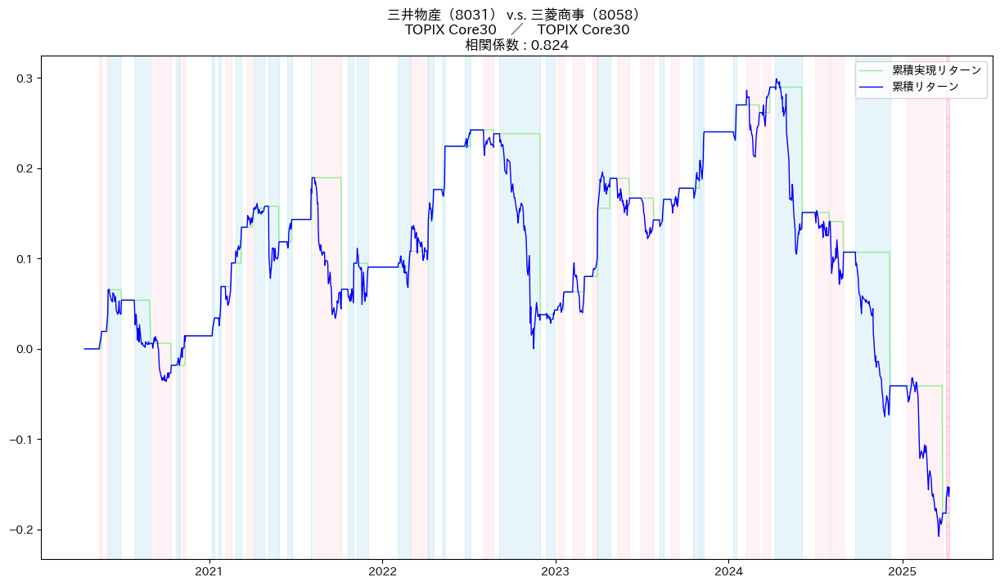

date_hlf_idx :  20


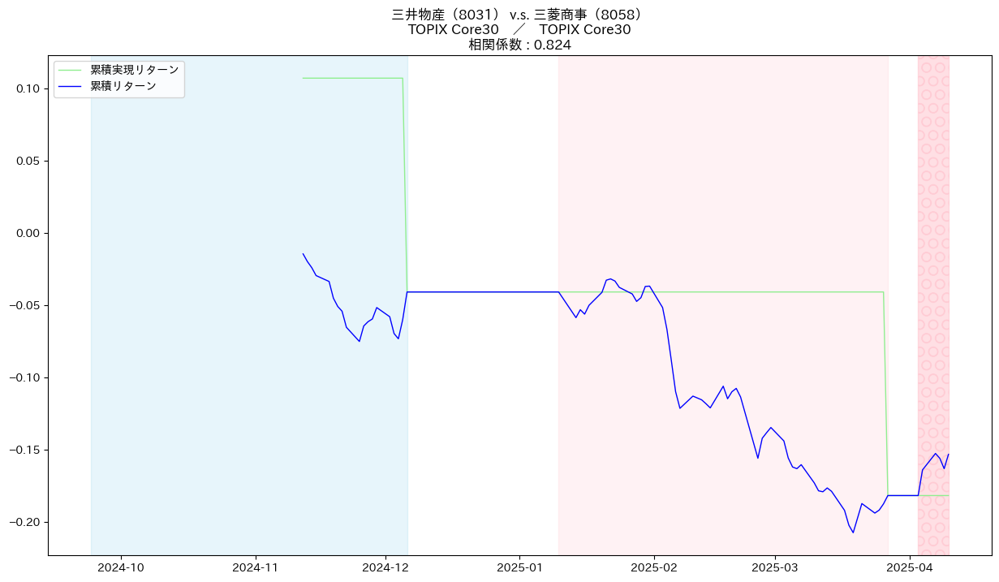

's_one_corr : '

Code0                      8053
CompanyName0               住友商事
ScaleCategory0    TOPIX Large70
Code1                      8058
CompanyName1               三菱商事
ScaleCategory1     TOPIX Core30
Corr                   0.823907
Name: 3, dtype: object

{'Code0': '8053',
 'Code1': '8058',
 'CompanyName0': '住友商事',
 'CompanyName1': '三菱商事',
 'Corr': 0.8239066660861565,
 'ScaleCategory0': 'TOPIX Large70',
 'ScaleCategory1': 'TOPIX Core30'}


date_hlf_idx :  21


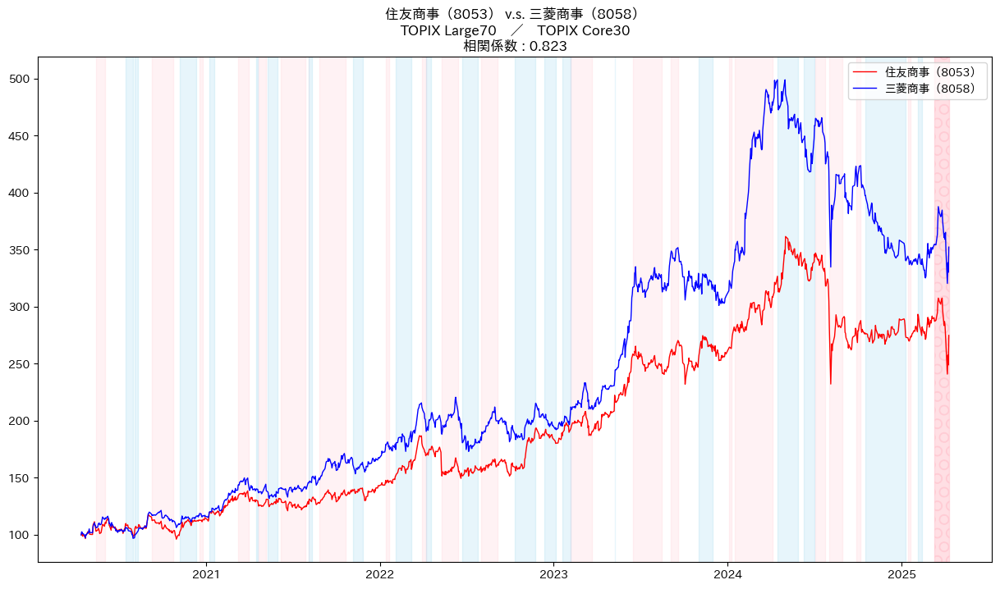

date_hlf_idx :  21


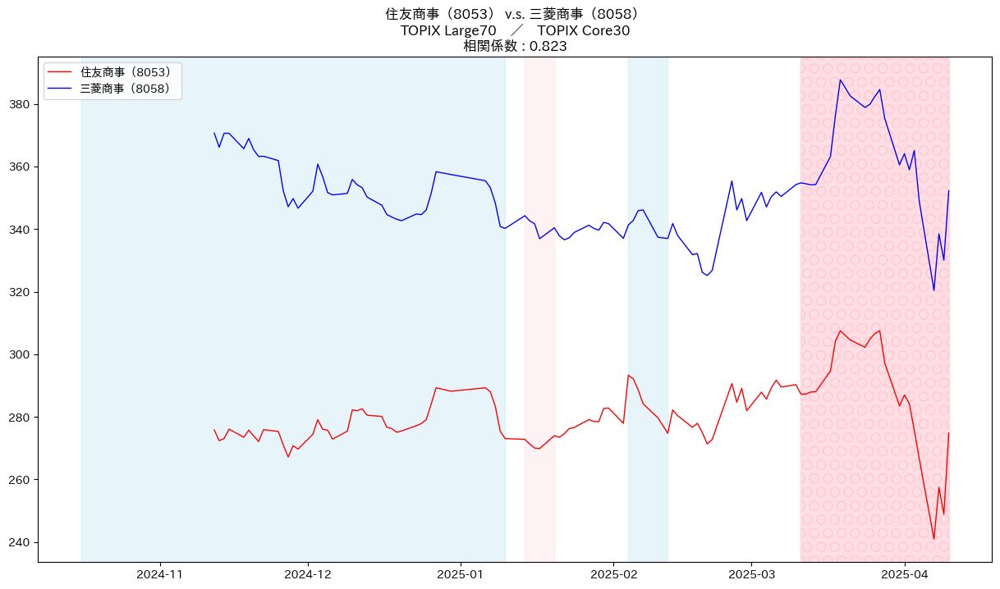

date_hlf_idx :  21


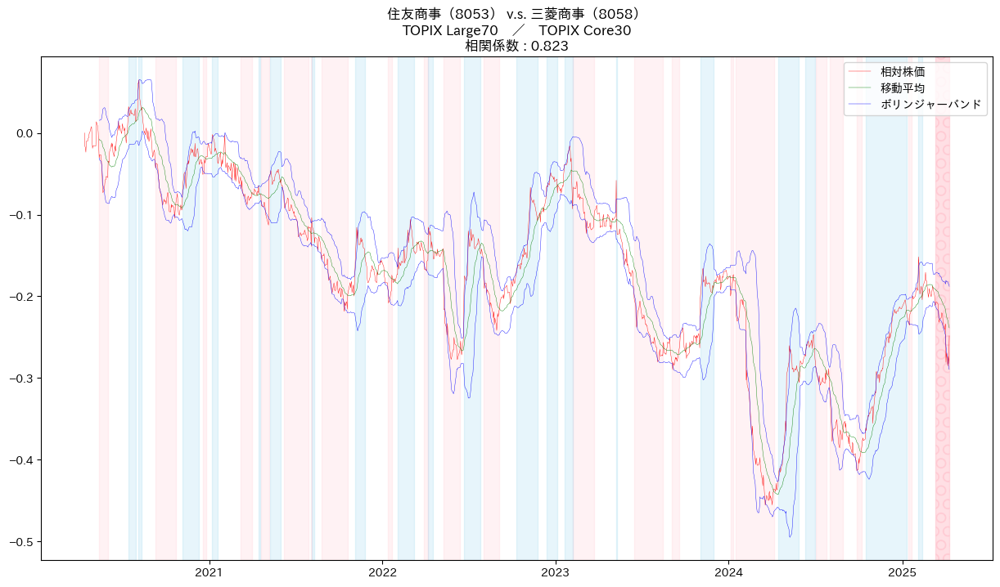

date_hlf_idx :  21


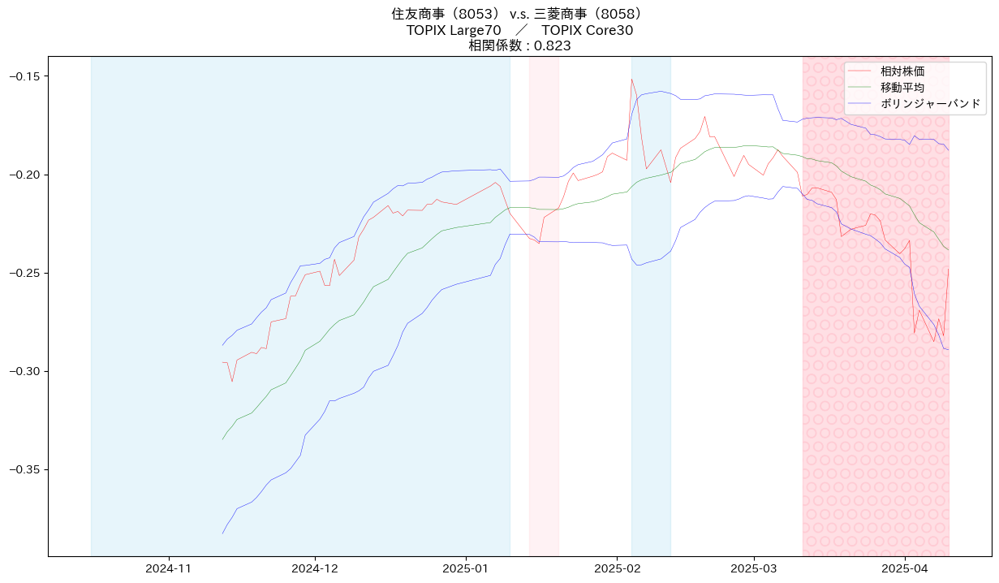

date_hlf_idx :  21


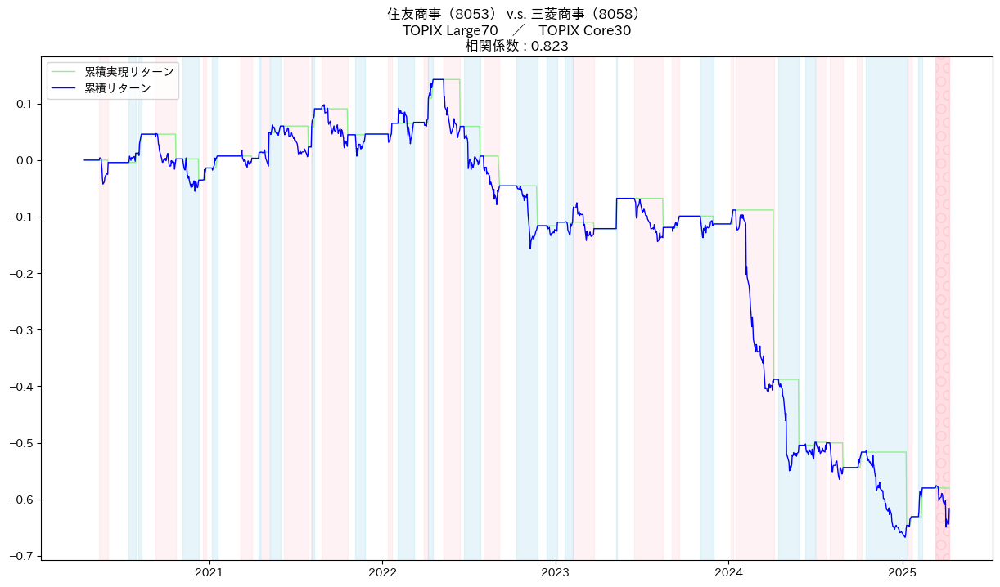

date_hlf_idx :  21


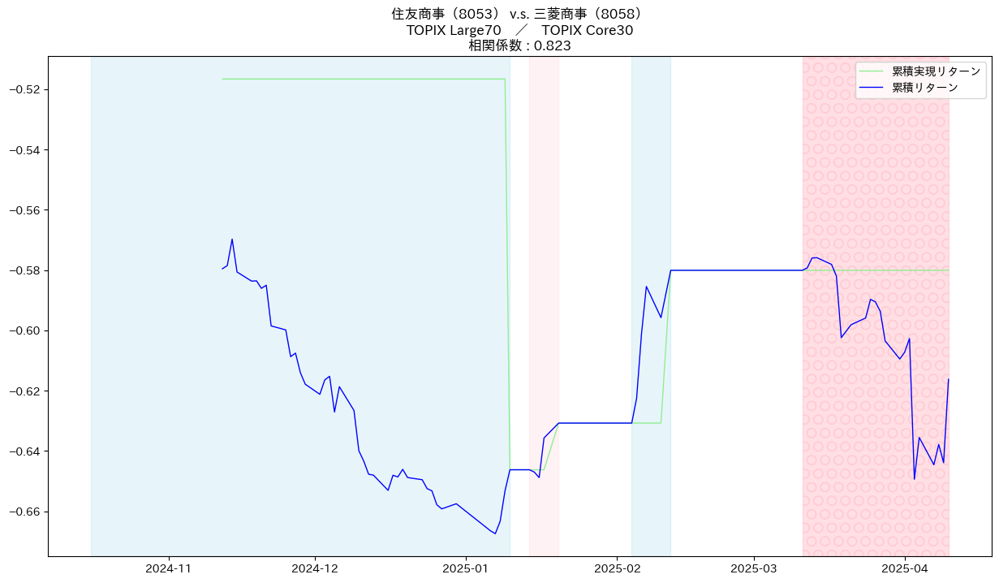

's_one_corr : '

Code0                      8002
CompanyName0                 丸紅
ScaleCategory0    TOPIX Large70
Code1                      8031
CompanyName1               三井物産
ScaleCategory1     TOPIX Core30
Corr                   0.819228
Name: 4, dtype: object

{'Code0': '8002',
 'Code1': '8031',
 'CompanyName0': '丸紅',
 'CompanyName1': '三井物産',
 'Corr': 0.8192277052046303,
 'ScaleCategory0': 'TOPIX Large70',
 'ScaleCategory1': 'TOPIX Core30'}


date_hlf_idx :  17


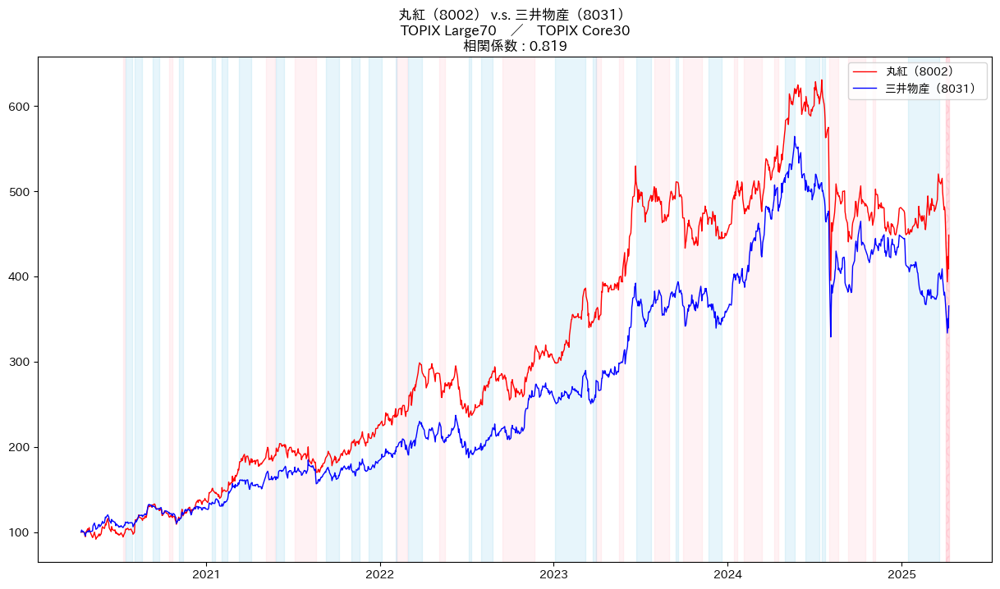

date_hlf_idx :  17


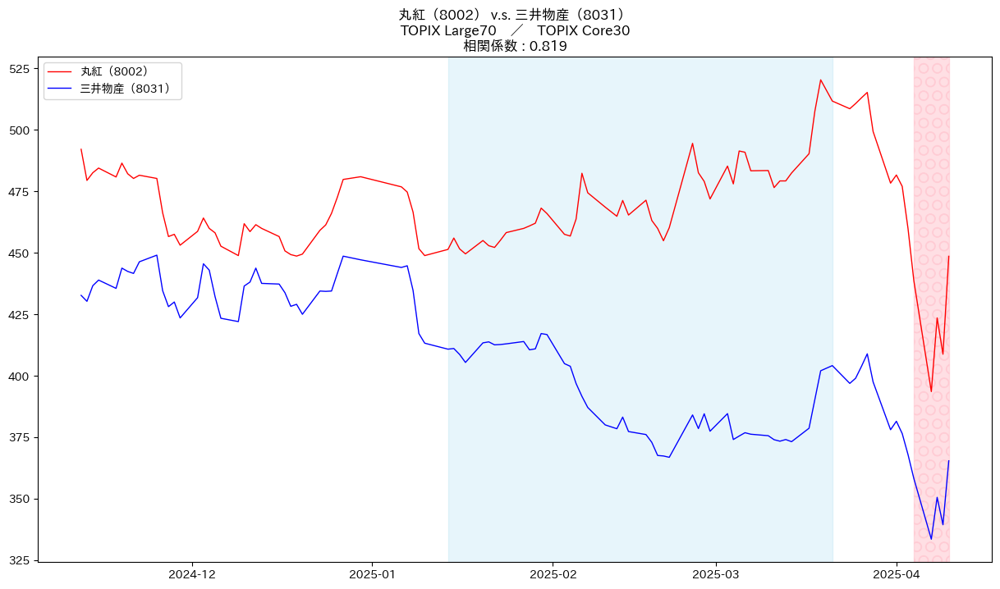

date_hlf_idx :  17


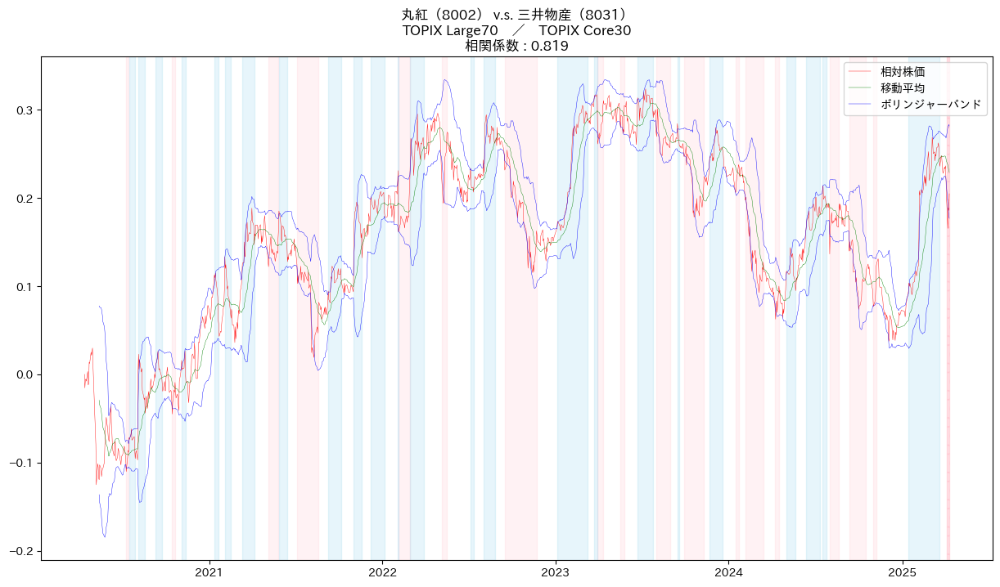

date_hlf_idx :  17


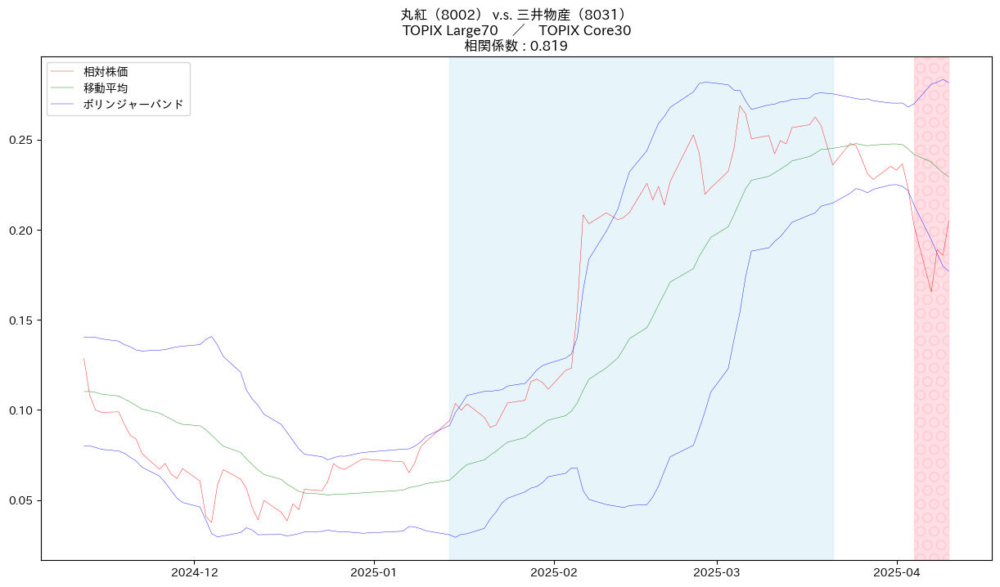

date_hlf_idx :  17


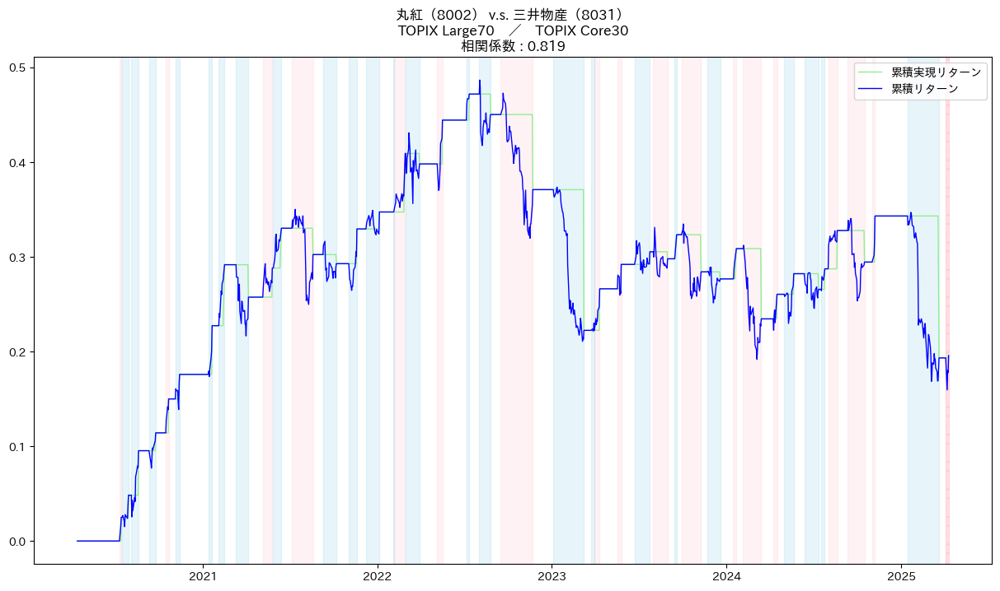

date_hlf_idx :  17


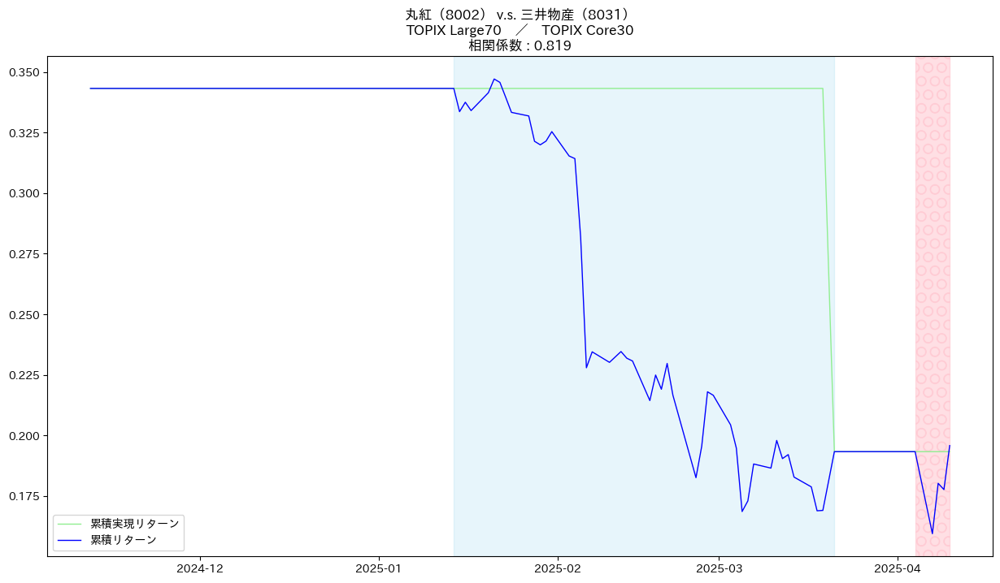

's_one_corr : '

Code0                      8001
CompanyName0              伊藤忠商事
ScaleCategory0     TOPIX Core30
Code1                      8053
CompanyName1               住友商事
ScaleCategory1    TOPIX Large70
Corr                    0.79749
Name: 5, dtype: object

{'Code0': '8001',
 'Code1': '8053',
 'CompanyName0': '伊藤忠商事',
 'CompanyName1': '住友商事',
 'Corr': 0.7974897954562749,
 'ScaleCategory0': 'TOPIX Core30',
 'ScaleCategory1': 'TOPIX Large70'}


date_hlf_idx :  24


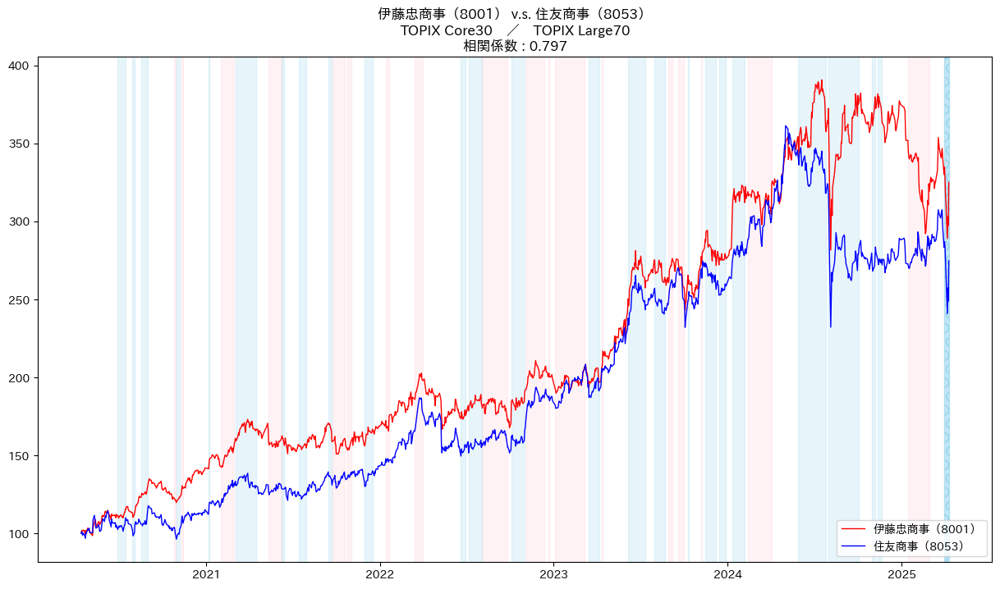

date_hlf_idx :  24


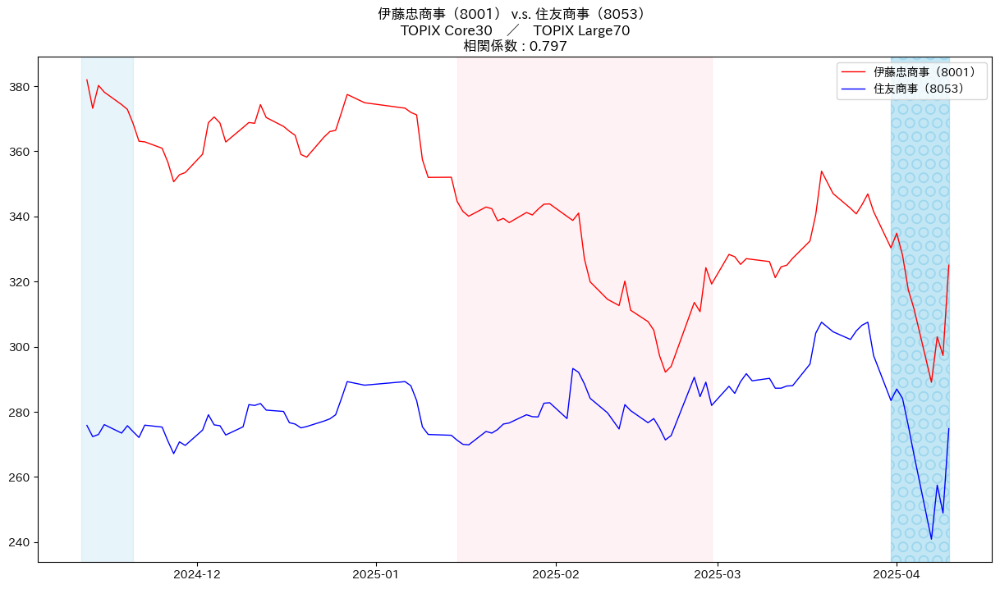

date_hlf_idx :  24


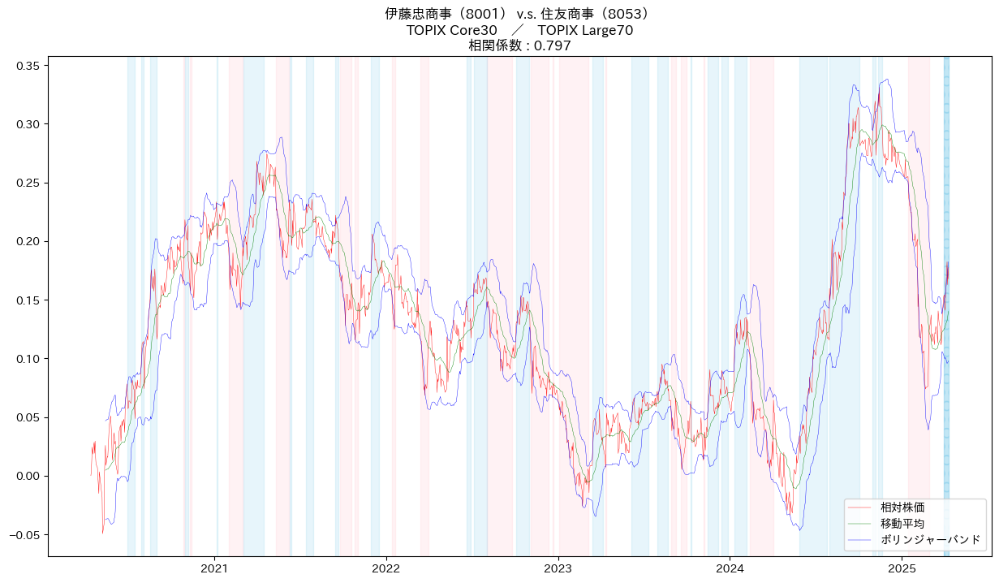

date_hlf_idx :  24


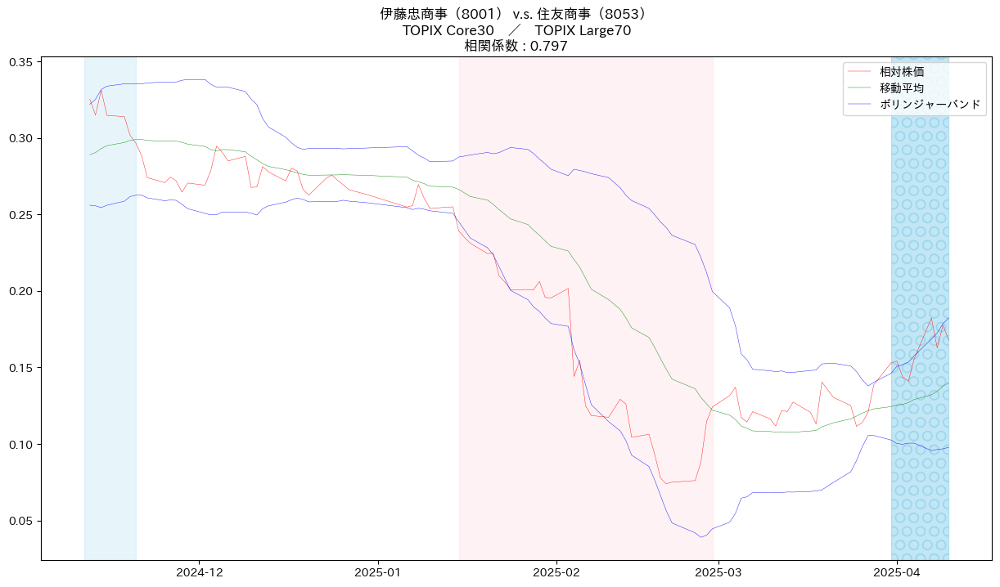

date_hlf_idx :  24


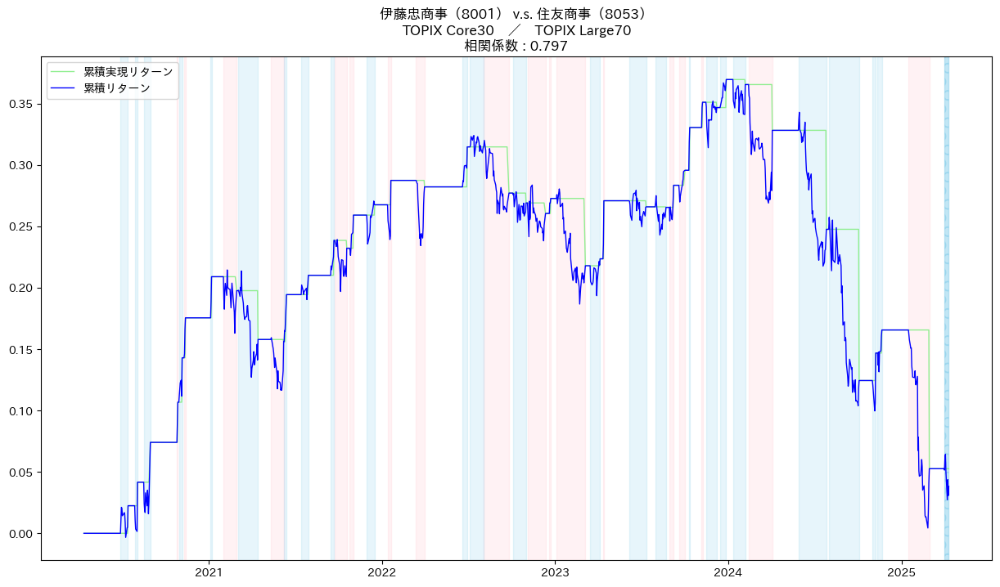

date_hlf_idx :  24


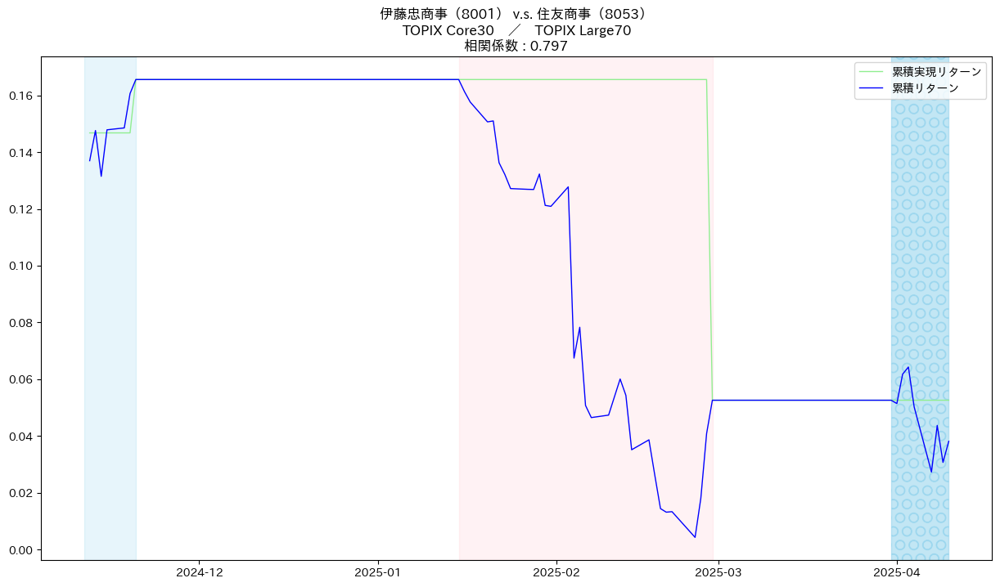

In [13]:
pair_stat_list = []

Universe_for_Sector33Code = ["7100", "6050"]

for Sector33Code in Universe_for_Sector33Code:
    
    df_list_universe = select_universe(Sector33Code = Sector33Code)

    df_returns = calc_retuns(df_list_universe["Code"].to_list())

    display(df_returns) 

    
    df_corr = create_pairs(df_returns)

    display(df_corr.head(10))
    display(df_corr.tail(10))

    pair_stat_list_one = create_graph_set()
    #debug print("pair_stat_list_one : ", pair_stat_list_one)
    pair_stat_list += pair_stat_list_one
    

In [14]:

print("pair_stat_list : ", pair_stat_list)

print(pd.DataFrame(pair_stat_list))
#     name   age
# 0  Alice  25.0
# 1    Bob   NaN

pair_stat_list :  [{'Code0': '8609', 'CompanyName0': '岡三証券グループ', 'ScaleCategory0': 'TOPIX Small 1', 'Code1': '8616', 'CompanyName1': '東海東京フィナンシャル・ホールディングス', 'ScaleCategory1': 'TOPIX Small 1', 'Corr': 0.7704382423982279, 'Ret0': 7.192982456140351, 'Ret1': 6.714628297362113, 'Cret0': 179.17888563049812, 'Cret1': 181.63265306122474, 'relative_price': -0.013601589733438486, 'relative_price_sq': 0.00018500324327677922, 'Cret0_ma': 192.96187683284415, 'Cret1_ma': 198.18367346938803, 'rret_ma': -0.026143866678222695, 'rret_ma2': 0.0010100768825594794, 'stdev': 0.01807138947814463, 'rret_ma_plus_2sigma': 0.009998912278066568, 'rret_ma_minus_2sigma': -0.06228664563451196, 'signal_long': 0.0, 'position_long': 0.0, 'return_from_long_position': nan, 'cumulative_long_position': 23.0, 'signal_short': 0.0, 'position_short': 1.0, 'return_from_short_position': nan, 'cumulative_short_position': 21.0, 'cumulative_evaluation_closed': 0.283457910627107, 'cumulative_evaluation': 0.22814975953366778}, {'Code

In [15]:
import sys

sys.exit()

SystemExit: 

C:\Users\jeguc\AppData\Local\Programs\Python\Python39\lib\site-packages\IPython\core\interactiveshell.py:3516: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


<h5>実験</h5>